In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime

In [2]:
log = pd.read_csv('C:/Users/user/Desktop/2022빅콘테스트_데이터분석리그_데이터분석분야_퓨처스부문_데이터셋_220908/log_data.csv')

In [3]:
spec = pd.read_csv('C:/Users/user/Desktop/2022빅콘테스트_데이터분석리그_데이터분석분야_퓨처스부문_데이터셋_220908/spec_count추가.csv', encoding = 'cp949')

In [4]:
log

,user_id,event,timestamp,mp_os,mp_app_version,date_cd
0,576409,StartLoanApply,2022-03-25 11:12:09,Android,3.8.2,2022-03-25
1,576409,ViewLoanApplyIntro,2022-03-25 11:12:09,Android,3.8.2,2022-03-25
2,72878,EndLoanApply,2022-03-25 11:14:44,Android,3.8.4,2022-03-25
3,645317,OpenApp,2022-03-25 11:15:09,iOS,3.6.1,2022-03-25
4,645317,UseLoanManage,2022-03-25 11:15:11,iOS,3.6.1,2022-03-25
...,...,...,...,...,...,...
17843988,242442,StartLoanApply,2022-05-27 16:08:21,Android,3.13.0,2022-05-27
17843989,242442,EndLoanApply,2022-05-27 16:08:21,Android,3.13.0,2022-05-27
17843990,593062,OpenApp,2022-05-27 16:19:10,Android,3.13.0,2022-05-27
17843991,593062,Login,2022-05-27 16:19:15,Android,3.13.0,2022-05-27


In [5]:
log['timestamp'] = pd.to_datetime(log['timestamp'],format='%Y-%m-%d %H:%M:%S' )

log['Month'] = log['timestamp'].dt.strftime('%m')

In [6]:
log = log[(log['Month']== '03')|(log['Month']== '04')|(log['Month']== '05')]

In [7]:
log.isnull().sum()

user_id                0
event                  0
timestamp              0
mp_os                784
mp_app_version    205438
date_cd                0
Month                  0
dtype: int64

In [8]:
log = log.drop(['mp_app_version', 'mp_os'],axis=1)

In [9]:
log

,user_id,event,timestamp,date_cd,Month
0,576409,StartLoanApply,2022-03-25 11:12:09,2022-03-25,03
1,576409,ViewLoanApplyIntro,2022-03-25 11:12:09,2022-03-25,03
2,72878,EndLoanApply,2022-03-25 11:14:44,2022-03-25,03
3,645317,OpenApp,2022-03-25 11:15:09,2022-03-25,03
4,645317,UseLoanManage,2022-03-25 11:15:11,2022-03-25,03
...,...,...,...,...,...
17843988,242442,StartLoanApply,2022-05-27 16:08:21,2022-05-27,05
17843989,242442,EndLoanApply,2022-05-27 16:08:21,2022-05-27,05
17843990,593062,OpenApp,2022-05-27 16:19:10,2022-05-27,05
17843991,593062,Login,2022-05-27 16:19:15,2022-05-27,05


In [10]:
log_unique = log['user_id'].unique()

In [11]:
log_user = pd.DataFrame(data = log_unique, columns= ['user_id'])

In [12]:
log_user

,user_id
0,576409
1,72878
2,645317
3,640185
4,814215
...,...
479768,652763
479769,441158
479770,319584
479771,748481


In [13]:
log_open_app = log[log['event'] == 'OpenApp']
log_ViewLoanApplyIntro = log[log['event'] == 'ViewLoanApplyIntro']
log_StartLoanApply = log[log['event'] == 'StartLoanApply']
log_EndLoanApply = log[log['event'] == 'EndLoanApply']
log_UseLoanManage = log[log['event'] == 'UseLoanManage']
log_UsePrepayCalc = log[log['event'] == 'UsePrepayCalc']
log_UseDSRCalc = log[log['event'] == 'UseDSRCalc']
log_GetCreditInfo = log[log['event'] == 'GetCreditInfo']

# Open_app_count

In [14]:
log_open_app

,user_id,event,timestamp,date_cd,Month
3,645317,OpenApp,2022-03-25 11:15:09,2022-03-25,03
12,814215,OpenApp,2022-03-25 11:44:34,2022-03-25,03
27,500083,OpenApp,2022-03-25 11:52:46,2022-03-25,03
33,38293,OpenApp,2022-03-25 11:54:44,2022-03-25,03
35,182629,OpenApp,2022-03-25 11:55:16,2022-03-25,03
...,...,...,...,...,...
17843972,380864,OpenApp,2022-05-27 15:46:35,2022-05-27,05
17843975,242442,OpenApp,2022-05-27 15:49:15,2022-05-27,05
17843981,742504,OpenApp,2022-05-27 16:05:27,2022-05-27,05
17843984,242442,OpenApp,2022-05-27 16:08:03,2022-05-27,05


In [15]:
log_open_app_gr = log_open_app.groupby(['user_id'])[['event']].count()
log_open_app_gr

,event
user_id,
11,3
12,11
17,3
20,13
21,5
...,...
879691,15
879692,5
879693,4


In [16]:
log_open_app_gr = log_open_app_gr.reset_index()
log_open_app_gr = log_open_app_gr.reset_index(drop=True)

In [17]:
log_open_app_gr = log_open_app_gr.rename(columns = {'event': 'OpenApp_count'})

In [18]:
log_open_app_gr

,user_id,OpenApp_count
0,11,3
1,12,11
2,17,3
3,20,13
4,21,5
...,...,...
353707,879691,15
353708,879692,5
353709,879693,4
353710,879696,1


# ViewLoanApplyIntro_count

In [19]:
log_ViewLoanApplyIntro

,user_id,event,timestamp,date_cd,Month
1,576409,ViewLoanApplyIntro,2022-03-25 11:12:09,2022-03-25,03
6,640185,ViewLoanApplyIntro,2022-03-25 11:42:38,2022-03-25,03
18,814215,ViewLoanApplyIntro,2022-03-25 11:45:43,2022-03-25,03
19,640185,ViewLoanApplyIntro,2022-03-25 11:45:45,2022-03-25,03
21,640185,ViewLoanApplyIntro,2022-03-25 11:46:03,2022-03-25,03
...,...,...,...,...,...
17843912,280317,ViewLoanApplyIntro,2022-05-27 14:30:45,2022-05-27,05
17843929,371875,ViewLoanApplyIntro,2022-05-27 15:05:27,2022-05-27,05
17843945,227009,ViewLoanApplyIntro,2022-05-27 15:14:57,2022-05-27,05
17843968,371875,ViewLoanApplyIntro,2022-05-27 15:30:16,2022-05-27,05


In [20]:
log_ViewLoanApplyIntro_gr = log_ViewLoanApplyIntro.groupby(['user_id'])[['event']].count()
log_ViewLoanApplyIntro_gr

,event
user_id,
11,3
12,11
17,3
19,1
20,9
...,...
879693,5
879694,1
879695,1


In [21]:
log_ViewLoanApplyIntro_gr = log_ViewLoanApplyIntro_gr.reset_index()
log_ViewLoanApplyIntro_gr = log_ViewLoanApplyIntro_gr.reset_index(drop=True)

In [22]:
log_ViewLoanApplyIntro_gr = log_ViewLoanApplyIntro_gr.rename(columns = {'event': 'ViewLoanApplyIntro_count'})

In [23]:
log_ViewLoanApplyIntro_gr

,user_id,ViewLoanApplyIntro_count
0,11,3
1,12,11
2,17,3
3,19,1
4,20,9
...,...,...
292224,879693,5
292225,879694,1
292226,879695,1
292227,879696,1


# StartLoanApply_count

In [24]:
log_StartLoanApply

,user_id,event,timestamp,date_cd,Month
0,576409,StartLoanApply,2022-03-25 11:12:09,2022-03-25,03
28,500083,StartLoanApply,2022-03-25 11:52:55,2022-03-25,03
40,182629,StartLoanApply,2022-03-25 11:55:27,2022-03-25,03
43,182629,StartLoanApply,2022-03-25 11:56:01,2022-03-25,03
48,618857,StartLoanApply,2022-03-25 11:57:28,2022-03-25,03
...,...,...,...,...,...
17843966,371875,StartLoanApply,2022-05-27 15:30:07,2022-05-27,05
17843973,380864,StartLoanApply,2022-05-27 15:47:29,2022-05-27,05
17843977,242442,StartLoanApply,2022-05-27 15:55:56,2022-05-27,05
17843986,242442,StartLoanApply,2022-05-27 16:08:10,2022-05-27,05


In [25]:
log_StartLoanApply_gr = log_StartLoanApply.groupby(['user_id'])[['event']].count()
log_StartLoanApply_gr

,event
user_id,
11,2
12,11
17,5
19,1
20,9
...,...
879692,5
879693,12
879694,1


In [26]:
log_StartLoanApply_gr = log_StartLoanApply_gr.reset_index()
log_StartLoanApply_gr = log_StartLoanApply_gr.reset_index(drop=True)

In [27]:
log_StartLoanApply_gr = log_StartLoanApply_gr.rename(columns = {'event': 'StartLoanApply_count'})

In [28]:
log_StartLoanApply_gr

,user_id,StartLoanApply_count
0,11,2
1,12,11
2,17,5
3,19,1
4,20,9
...,...,...
268522,879692,5
268523,879693,12
268524,879694,1
268525,879695,1


In [29]:
log_StartLoanApply_gr.isnull().sum()

user_id                 0
StartLoanApply_count    0
dtype: int64

# EndLoanApply_count

In [30]:
log_EndLoanApply

,user_id,event,timestamp,date_cd,Month
2,72878,EndLoanApply,2022-03-25 11:14:44,2022-03-25,03
24,640185,EndLoanApply,2022-03-25 11:49:25,2022-03-25,03
36,500083,EndLoanApply,2022-03-25 11:55:19,2022-03-25,03
37,500083,EndLoanApply,2022-03-25 11:55:19,2022-03-25,03
38,500083,EndLoanApply,2022-03-25 11:55:19,2022-03-25,03
...,...,...,...,...,...
17843970,371875,EndLoanApply,2022-05-27 15:32:49,2022-05-27,05
17843974,380864,EndLoanApply,2022-05-27 15:47:30,2022-05-27,05
17843980,242442,EndLoanApply,2022-05-27 15:58:36,2022-05-27,05
17843987,242442,EndLoanApply,2022-05-27 16:08:10,2022-05-27,05


In [31]:
log_EndLoanApply_gr = log_EndLoanApply.groupby(['user_id'])[['event']].count()
log_EndLoanApply_gr

,event
user_id,
11,5
12,28
17,4
19,3
20,9
...,...
879692,7
879693,11
879694,3


In [32]:
log_EndLoanApply_gr = log_EndLoanApply_gr.reset_index()
log_EndLoanApply_gr = log_EndLoanApply_gr.reset_index(drop=True)

In [33]:
log_EndLoanApply_gr = log_EndLoanApply_gr.rename(columns = {'event': 'EndLoanApply_count'})

In [34]:
log_EndLoanApply_gr

,user_id,EndLoanApply_count
0,11,5
1,12,28
2,17,4
3,19,3
4,20,9
...,...,...
249266,879692,7
249267,879693,11
249268,879694,3
249269,879695,1


# UseLoanManage_count

In [35]:
log_UseLoanManage

,user_id,event,timestamp,date_cd,Month
4,645317,UseLoanManage,2022-03-25 11:15:11,2022-03-25,03
5,640185,UseLoanManage,2022-03-25 11:41:53,2022-03-25,03
8,640185,UseLoanManage,2022-03-25 11:43:57,2022-03-25,03
9,640185,UseLoanManage,2022-03-25 11:44:04,2022-03-25,03
10,640185,UseLoanManage,2022-03-25 11:44:16,2022-03-25,03
...,...,...,...,...,...
17843950,78603,UseLoanManage,2022-05-27 15:19:22,2022-05-27,05
17843955,227009,UseLoanManage,2022-05-27 15:22:21,2022-05-27,05
17843956,78603,UseLoanManage,2022-05-27 15:22:29,2022-05-27,05
17843983,742504,UseLoanManage,2022-05-27 16:05:43,2022-05-27,05


In [36]:
log_UseLoanManage_gr = log_UseLoanManage.groupby(['user_id'])[['event']].count()
log_UseLoanManage_gr

,event
user_id,
11,9
12,1
17,1
21,2
24,1
...,...
879683,12
879689,9
879692,6


In [37]:
log_UseLoanManage_gr = log_UseLoanManage_gr.reset_index()
log_UseLoanManage_gr = log_UseLoanManage_gr.reset_index(drop=True)

In [38]:
log_UseLoanManage_gr = log_UseLoanManage_gr.rename(columns = {'event': 'log_UseLoanManage_count'})

In [39]:
log_UseLoanManage_gr

,user_id,log_UseLoanManage_count
0,11,9
1,12,1
2,17,1
3,21,2
4,24,1
...,...,...
245710,879683,12
245711,879689,9
245712,879692,6
245713,879693,3


# UseDSRCalc_count

In [40]:
log_UseDSRCalc

,user_id,event,timestamp,date_cd,Month
201,695829,UseDSRCalc,2022-03-25 16:18:13,2022-03-25,03
2568,7956,UseDSRCalc,2022-03-01 17:16:51,2022-03-01,03
2971,109911,UseDSRCalc,2022-03-01 11:40:59,2022-03-01,03
11252,362863,UseDSRCalc,2022-04-29 07:27:08,2022-04-29,04
11261,569050,UseDSRCalc,2022-04-29 07:48:29,2022-04-29,04
...,...,...,...,...,...
17758575,842425,UseDSRCalc,2022-04-14 19:30:50,2022-04-14,04
17761143,528244,UseDSRCalc,2022-04-14 15:01:19,2022-04-14,04
17762111,412086,UseDSRCalc,2022-04-14 01:02:09,2022-04-14,04
17762132,678034,UseDSRCalc,2022-04-14 01:54:52,2022-04-14,04


In [41]:
log_UseDSRCalc_gr = log_UseDSRCalc.groupby(['user_id'])[['event']].count()
log_UseDSRCalc_gr

,event
user_id,
194,1
830,1
871,1
1176,1
1229,2
...,...
878796,1
878870,1
879287,6


In [42]:
log_UseDSRCalc_gr = log_UseDSRCalc_gr.reset_index()
log_UseDSRCalc_gr = log_UseDSRCalc_gr.reset_index(drop=True)

In [43]:
log_UseDSRCalc_gr = log_UseDSRCalc_gr.rename(columns = {'event': 'UseDSRCalc_count'})

In [44]:
log_UseDSRCalc_gr

,user_id,UseDSRCalc_count
0,194,1
1,830,1
2,871,1
3,1176,1
4,1229,2
...,...,...
3520,878796,1
3521,878870,1
3522,879287,6
3523,879399,1


# UsePrepayCalc

In [45]:
log_UsePrepayCalc

,user_id,event,timestamp,date_cd,Month
7,640185,UsePrepayCalc,2022-03-25 11:43:07,2022-03-25,03
20,640185,UsePrepayCalc,2022-03-25 11:45:54,2022-03-25,03
399,677710,UsePrepayCalc,2022-03-25 06:59:45,2022-03-25,03
462,318995,UsePrepayCalc,2022-03-25 08:50:26,2022-03-25,03
658,160211,UsePrepayCalc,2022-03-01 04:21:22,2022-03-01,03
...,...,...,...,...,...
17755945,766754,UsePrepayCalc,2022-04-14 21:06:35,2022-04-14,04
17757372,46390,UsePrepayCalc,2022-04-14 22:26:11,2022-04-14,04
17760070,664995,UsePrepayCalc,2022-04-14 07:06:13,2022-04-14,04
17766198,628441,UsePrepayCalc,2022-05-30 11:55:58,2022-05-30,05


In [46]:
log_UsePrepayCalc_gr = log_UsePrepayCalc.groupby(['user_id'])[['event']].count()
log_UsePrepayCalc_gr

,event
user_id,
11,1
96,1
99,1
194,1
195,1
...,...
878507,2
878694,3
879036,1


In [47]:
log_UsePrepayCalc_gr = log_UsePrepayCalc_gr.reset_index()
log_UsePrepayCalc_gr = log_UsePrepayCalc_gr.reset_index(drop=True)

In [48]:
log_UsePrepayCalc_gr = log_UsePrepayCalc_gr.rename(columns = {'event': 'UsePrepayCalc_count'})

In [49]:
log_UsePrepayCalc_gr

,user_id,UsePrepayCalc_count
0,11,1
1,96,1
2,99,1
3,194,1
4,195,1
...,...,...
4372,878507,2
4373,878694,3
4374,879036,1
4375,879287,4


# GetCreditInfo_count

In [50]:
log_GetCreditInfo

,user_id,event,timestamp,date_cd,Month
209900,78048,GetCreditInfo,2022-04-30 23:49:59,2022-04-30,04
209901,394401,GetCreditInfo,2022-04-30 23:50:00,2022-04-30,04
209902,43329,GetCreditInfo,2022-04-30 23:50:23,2022-04-30,04
209903,658090,GetCreditInfo,2022-04-30 23:50:36,2022-04-30,04
209904,372453,GetCreditInfo,2022-04-30 23:50:37,2022-04-30,04
...,...,...,...,...,...
16752236,370159,GetCreditInfo,2022-05-17 20:00:13,2022-05-17,05
16752237,660664,GetCreditInfo,2022-05-17 20:00:13,2022-05-17,05
16752238,370159,GetCreditInfo,2022-05-17 20:00:15,2022-05-17,05
16752239,650522,GetCreditInfo,2022-05-17 20:00:17,2022-05-17,05


In [51]:
log_GetCreditInfo_gr = log_GetCreditInfo.groupby(['user_id'])[['event']].count()
log_GetCreditInfo_gr

,event
user_id,
1,2
7,1
9,3
11,8
12,3
...,...
879689,5
879691,2
879692,8


In [52]:
log_GetCreditInfo_gr = log_GetCreditInfo_gr.reset_index()
log_GetCreditInfo_gr = log_GetCreditInfo_gr.reset_index(drop=True)

In [53]:
log_GetCreditInfo_gr = log_GetCreditInfo_gr.rename(columns = {'event': 'GetCreditInfo_count'})

In [54]:
log_GetCreditInfo_gr

,user_id,GetCreditInfo_count
0,1,2
1,7,1
2,9,3
3,11,8
4,12,3
...,...,...
366892,879689,5
366893,879691,2
366894,879692,8
366895,879693,1


# 병합

In [55]:
log_count = pd.merge(left=log_user, right=log_open_app_gr, how='left', on=['user_id'])
log_count

,user_id,OpenApp_count
0,576409,34.0
1,72878,2.0
2,645317,47.0
3,640185,21.0
4,814215,16.0
...,...,...
479768,652763,1.0
479769,441158,1.0
479770,319584,1.0
479771,748481,1.0


In [56]:
log_count = pd.merge(left=log_count, right=log_ViewLoanApplyIntro_gr, how='left', on=['user_id'])
log_count

,user_id,OpenApp_count,ViewLoanApplyIntro_count
0,576409,34.0,30.0
1,72878,2.0,4.0
2,645317,47.0,23.0
3,640185,21.0,9.0
4,814215,16.0,9.0
...,...,...,...
479768,652763,1.0,NaN
479769,441158,1.0,2.0
479770,319584,1.0,NaN
479771,748481,1.0,NaN


In [57]:
log_count = pd.merge(left=log_count, right=log_StartLoanApply_gr, how='left', on=['user_id'])
log_count

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count
0,576409,34.0,30.0,33.0
1,72878,2.0,4.0,4.0
2,645317,47.0,23.0,38.0
3,640185,21.0,9.0,10.0
4,814215,16.0,9.0,4.0
...,...,...,...,...
479768,652763,1.0,NaN,2.0
479769,441158,1.0,2.0,2.0
479770,319584,1.0,NaN,NaN
479771,748481,1.0,NaN,NaN


In [58]:
log_count = pd.merge(left=log_count, right=log_EndLoanApply_gr, how='left', on=['user_id'])
log_count

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count
0,576409,34.0,30.0,33.0,34.0
1,72878,2.0,4.0,4.0,5.0
2,645317,47.0,23.0,38.0,44.0
3,640185,21.0,9.0,10.0,18.0
4,814215,16.0,9.0,4.0,13.0
...,...,...,...,...,...
479768,652763,1.0,NaN,2.0,3.0
479769,441158,1.0,2.0,2.0,1.0
479770,319584,1.0,NaN,NaN,NaN
479771,748481,1.0,NaN,NaN,NaN


In [59]:
log_count = pd.merge(left=log_count, right=log_UseLoanManage_gr, how='left', on=['user_id'])
log_count

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count
0,576409,34.0,30.0,33.0,34.0,7.0
1,72878,2.0,4.0,4.0,5.0,1.0
2,645317,47.0,23.0,38.0,44.0,7.0
3,640185,21.0,9.0,10.0,18.0,39.0
4,814215,16.0,9.0,4.0,13.0,12.0
...,...,...,...,...,...,...
479768,652763,1.0,NaN,2.0,3.0,NaN
479769,441158,1.0,2.0,2.0,1.0,NaN
479770,319584,1.0,NaN,NaN,NaN,NaN
479771,748481,1.0,NaN,NaN,NaN,NaN


In [60]:
log_count = pd.merge(left=log_count, right=log_UseDSRCalc_gr, how='left', on=['user_id'])
log_count

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count
0,576409,34.0,30.0,33.0,34.0,7.0,NaN
1,72878,2.0,4.0,4.0,5.0,1.0,NaN
2,645317,47.0,23.0,38.0,44.0,7.0,NaN
3,640185,21.0,9.0,10.0,18.0,39.0,NaN
4,814215,16.0,9.0,4.0,13.0,12.0,NaN
...,...,...,...,...,...,...,...
479768,652763,1.0,NaN,2.0,3.0,NaN,NaN
479769,441158,1.0,2.0,2.0,1.0,NaN,NaN
479770,319584,1.0,NaN,NaN,NaN,NaN,NaN
479771,748481,1.0,NaN,NaN,NaN,NaN,NaN


In [61]:
log_count = pd.merge(left=log_count, right=log_UsePrepayCalc_gr, how='left', on=['user_id'])
log_count

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count
0,576409,34.0,30.0,33.0,34.0,7.0,NaN,NaN
1,72878,2.0,4.0,4.0,5.0,1.0,NaN,NaN
2,645317,47.0,23.0,38.0,44.0,7.0,NaN,NaN
3,640185,21.0,9.0,10.0,18.0,39.0,NaN,2.0
4,814215,16.0,9.0,4.0,13.0,12.0,NaN,NaN
...,...,...,...,...,...,...,...,...
479768,652763,1.0,NaN,2.0,3.0,NaN,NaN,NaN
479769,441158,1.0,2.0,2.0,1.0,NaN,NaN,NaN
479770,319584,1.0,NaN,NaN,NaN,NaN,NaN,NaN
479771,748481,1.0,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
log_count = pd.merge(left=log_count, right=log_GetCreditInfo_gr, how='left', on=['user_id'])
log_count

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
0,576409,34.0,30.0,33.0,34.0,7.0,NaN,NaN,7.0
1,72878,2.0,4.0,4.0,5.0,1.0,NaN,NaN,2.0
2,645317,47.0,23.0,38.0,44.0,7.0,NaN,NaN,7.0
3,640185,21.0,9.0,10.0,18.0,39.0,NaN,2.0,34.0
4,814215,16.0,9.0,4.0,13.0,12.0,NaN,NaN,16.0
...,...,...,...,...,...,...,...,...,...
479768,652763,1.0,NaN,2.0,3.0,NaN,NaN,NaN,NaN
479769,441158,1.0,2.0,2.0,1.0,NaN,NaN,NaN,NaN
479770,319584,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
479771,748481,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
log_count.isnull().sum()

user_id                          0
OpenApp_count               126061
ViewLoanApplyIntro_count    187544
StartLoanApply_count        211246
EndLoanApply_count          230502
log_UseLoanManage_count     234058
UseDSRCalc_count            476248
UsePrepayCalc_count         475396
GetCreditInfo_count         112876
dtype: int64

# open_app결측치 처리

In [64]:
log_count_opennull = log_count[log_count['OpenApp_count'].isnull()]

In [65]:
log_count_opennull

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
18,831139,NaN,1.0,1.0,2.0,NaN,NaN,NaN,NaN
24,193072,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53,746559,NaN,NaN,1.0,1.0,NaN,NaN,NaN,1.0
67,221260,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
90,217963,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...
479761,832861,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
479763,837640,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
479766,624447,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN
479767,877407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
lopen_null_id = log_count_opennull[['user_id']]
lopen_null_id

,user_id
18,831139
24,193072
53,746559
67,221260
90,217963
...,...
479761,832861
479763,837640
479766,624447
479767,877407


In [67]:
log_count_opennull.describe()

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
count,126061.000000,0.0,38562.000000,36304.000000,32325.000000,22612.000000,315.000000,362.000000,101918.000000
mean,440058.454217,NaN,1.318111,1.299251,2.213488,1.551919,1.069841,1.455801,1.846141
std,254188.556740,NaN,0.736746,0.710865,2.102303,1.343325,0.267469,0.926365,1.263363
min,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,219938.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,440483.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,660704.000000,NaN,1.000000,1.000000,3.000000,2.000000,1.000000,2.000000,2.000000
max,879695.000000,NaN,13.000000,13.000000,36.000000,53.000000,3.000000,8.000000,46.000000


In [68]:
log

,user_id,event,timestamp,date_cd,Month
0,576409,StartLoanApply,2022-03-25 11:12:09,2022-03-25,03
1,576409,ViewLoanApplyIntro,2022-03-25 11:12:09,2022-03-25,03
2,72878,EndLoanApply,2022-03-25 11:14:44,2022-03-25,03
3,645317,OpenApp,2022-03-25 11:15:09,2022-03-25,03
4,645317,UseLoanManage,2022-03-25 11:15:11,2022-03-25,03
...,...,...,...,...,...
17843988,242442,StartLoanApply,2022-05-27 16:08:21,2022-05-27,05
17843989,242442,EndLoanApply,2022-05-27 16:08:21,2022-05-27,05
17843990,593062,OpenApp,2022-05-27 16:19:10,2022-05-27,05
17843991,593062,Login,2022-05-27 16:19:15,2022-05-27,05


In [69]:
log

,user_id,event,timestamp,date_cd,Month
0,576409,StartLoanApply,2022-03-25 11:12:09,2022-03-25,03
1,576409,ViewLoanApplyIntro,2022-03-25 11:12:09,2022-03-25,03
2,72878,EndLoanApply,2022-03-25 11:14:44,2022-03-25,03
3,645317,OpenApp,2022-03-25 11:15:09,2022-03-25,03
4,645317,UseLoanManage,2022-03-25 11:15:11,2022-03-25,03
...,...,...,...,...,...
17843988,242442,StartLoanApply,2022-05-27 16:08:21,2022-05-27,05
17843989,242442,EndLoanApply,2022-05-27 16:08:21,2022-05-27,05
17843990,593062,OpenApp,2022-05-27 16:19:10,2022-05-27,05
17843991,593062,Login,2022-05-27 16:19:15,2022-05-27,05


In [70]:
log['Hour'] = log['timestamp'].dt.strftime('%H')

In [71]:
log

,user_id,event,timestamp,date_cd,Month,Hour
0,576409,StartLoanApply,2022-03-25 11:12:09,2022-03-25,03,11
1,576409,ViewLoanApplyIntro,2022-03-25 11:12:09,2022-03-25,03,11
2,72878,EndLoanApply,2022-03-25 11:14:44,2022-03-25,03,11
3,645317,OpenApp,2022-03-25 11:15:09,2022-03-25,03,11
4,645317,UseLoanManage,2022-03-25 11:15:11,2022-03-25,03,11
...,...,...,...,...,...,...
17843988,242442,StartLoanApply,2022-05-27 16:08:21,2022-05-27,05,16
17843989,242442,EndLoanApply,2022-05-27 16:08:21,2022-05-27,05,16
17843990,593062,OpenApp,2022-05-27 16:19:10,2022-05-27,05,16
17843991,593062,Login,2022-05-27 16:19:15,2022-05-27,05,16


In [72]:
log.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12907328 entries, 0 to 17843992
Data columns (total 6 columns):
 #   Column     Dtype         
---  ------     -----         
 0   user_id    int64         
 1   event      object        
 2   timestamp  datetime64[ns]
 3   date_cd    object        
 4   Month      object        
 5   Hour       object        
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 689.3+ MB


In [73]:
log['date_cd'] = log['date_cd'] + ' ' + log['Hour']

In [74]:
log = log.drop(['Hour'], axis=1)

In [75]:
log

,user_id,event,timestamp,date_cd,Month
0,576409,StartLoanApply,2022-03-25 11:12:09,2022-03-25 11,03
1,576409,ViewLoanApplyIntro,2022-03-25 11:12:09,2022-03-25 11,03
2,72878,EndLoanApply,2022-03-25 11:14:44,2022-03-25 11,03
3,645317,OpenApp,2022-03-25 11:15:09,2022-03-25 11,03
4,645317,UseLoanManage,2022-03-25 11:15:11,2022-03-25 11,03
...,...,...,...,...,...
17843988,242442,StartLoanApply,2022-05-27 16:08:21,2022-05-27 16,05
17843989,242442,EndLoanApply,2022-05-27 16:08:21,2022-05-27 16,05
17843990,593062,OpenApp,2022-05-27 16:19:10,2022-05-27 16,05
17843991,593062,Login,2022-05-27 16:19:15,2022-05-27 16,05


In [76]:
log_null = pd.merge(left=lopen_null_id, right=log, how='left', on=['user_id'])
log_null

,user_id,event,timestamp,date_cd,Month
0,831139,EndLoanApply,2022-03-25 13:07:54,2022-03-25 13,03
1,831139,Login,2022-03-25 08:33:17,2022-03-25 08,03
2,831139,StartLoanApply,2022-03-25 08:33:20,2022-03-25 08,03
3,831139,ViewLoanApplyIntro,2022-03-25 08:33:20,2022-03-25 08,03
4,831139,CompleteIDCertification,2022-03-25 08:33:48,2022-03-25 08,03
...,...,...,...,...,...
480328,877407,Login,2022-05-27 21:02:24,2022-05-27 21,05
480329,865181,StartLoanApply,2022-05-27 14:13:41,2022-05-27 14,05
480330,865181,ViewLoanApplyIntro,2022-05-27 14:13:41,2022-05-27 14,05
480331,865181,CompleteIDCertification,2022-05-27 14:13:56,2022-05-27 14,05


In [77]:
log_null_1 = log_null.drop_duplicates(['user_id', 'date_cd'], keep = 'first')
log_null_1

,user_id,event,timestamp,date_cd,Month
0,831139,EndLoanApply,2022-03-25 13:07:54,2022-03-25 13,03
1,831139,Login,2022-03-25 08:33:17,2022-03-25 08,03
6,193072,Login,2022-03-25 14:15:49,2022-03-25 14,03
7,746559,Login,2022-03-25 19:58:10,2022-03-25 19,03
11,221260,Login,2022-03-25 05:49:41,2022-03-25 05,03
...,...,...,...,...,...
480322,832861,Login,2022-05-27 13:35:09,2022-05-27 13,05
480323,837640,Login,2022-05-27 18:21:41,2022-05-27 18,05
480324,624447,StartLoanApply,2022-05-27 06:37:11,2022-05-27 06,05
480328,877407,Login,2022-05-27 21:02:24,2022-05-27 21,05


In [78]:
log_null_1['user_id_count'] = log_null_1['user_id']

In [79]:
log_null_1 = log_null_1.groupby(['user_id'])[['user_id_count']].count()
log_null_1

,user_id_count
user_id,
1,1
7,1
9,1
19,1
33,1
...,...
879622,1
879630,1
879658,1


In [80]:
log_null_1 = log_null_1.reset_index()
log_null_1 = log_null_1.reset_index(drop=True)
log_null_1

,user_id,user_id_count
0,1,1
1,7,1
2,9,1
3,19,1
4,33,1
...,...,...
126056,879622,1
126057,879630,1
126058,879658,1
126059,879694,1


In [81]:
log_null_1.describe()

,user_id,user_id_count
count,126061.000000,126061.000000
mean,440058.454217,1.249649
std,254188.556740,0.567779
min,1.000000,1.000000
25%,219938.000000,1.000000
50%,440483.000000,1.000000
75%,660704.000000,1.000000
max,879695.000000,18.000000


In [82]:
log_1 = pd.merge(left=log_count, right=log_null_1, how='left', on=['user_id'])
log_1

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,user_id_count
0,576409,34.0,30.0,33.0,34.0,7.0,NaN,NaN,7.0,NaN
1,72878,2.0,4.0,4.0,5.0,1.0,NaN,NaN,2.0,NaN
2,645317,47.0,23.0,38.0,44.0,7.0,NaN,NaN,7.0,NaN
3,640185,21.0,9.0,10.0,18.0,39.0,NaN,2.0,34.0,NaN
4,814215,16.0,9.0,4.0,13.0,12.0,NaN,NaN,16.0,NaN
...,...,...,...,...,...,...,...,...,...,...
479768,652763,1.0,NaN,2.0,3.0,NaN,NaN,NaN,NaN,NaN
479769,441158,1.0,2.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN
479770,319584,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
479771,748481,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [83]:
log_1['OpenApp_count'] = log_1['OpenApp_count'].fillna(log_1['user_id_count'])

In [84]:
log_1 = log_1.drop(['user_id_count'], axis=1)

In [85]:
log_1.isnull().sum()

user_id                          0
OpenApp_count                    0
ViewLoanApplyIntro_count    187544
StartLoanApply_count        211246
EndLoanApply_count          230502
log_UseLoanManage_count     234058
UseDSRCalc_count            476248
UsePrepayCalc_count         475396
GetCreditInfo_count         112876
dtype: int64

In [86]:
log_1.describe()

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
count,479773.000000,479773.000000,292229.000000,268527.000000,249271.000000,245715.000000,3525.000000,4377.000000,366897.000000
mean,439603.617058,5.491612,4.511777,5.211357,8.002547,4.774580,1.287943,1.644048,4.959825
std,253983.064236,10.741263,7.018631,8.441602,14.410686,8.737308,0.966924,1.528928,9.646543
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,219490.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000
50%,439804.000000,2.000000,2.000000,2.000000,4.000000,2.000000,1.000000,1.000000,2.000000
75%,659556.000000,6.000000,5.000000,6.000000,9.000000,5.000000,1.000000,2.000000,5.000000
max,879698.000000,1353.000000,534.000000,511.000000,1363.000000,1025.000000,23.000000,25.000000,1037.000000


# log데이터 이상치 제거를 위해 상한선 조정

In [87]:
log_1.loc[log_1['OpenApp_count']> 6,'OpenApp_count'] = 6
log_1.loc[log_1['ViewLoanApplyIntro_count']> 5,'ViewLoanApplyIntro_count'] = 5
log_1.loc[log_1['StartLoanApply_count']> 6,'StartLoanApply_count'] = 6
log_1.loc[log_1['EndLoanApply_count']> 9,'EndLoanApply_count'] = 9
log_1.loc[log_1['log_UseLoanManage_count']> 5,'log_UseLoanManage_count'] = 5
log_1.loc[log_1['UseDSRCalc_count']> 1,'UseDSRCalc_count'] = 1
log_1.loc[log_1['UsePrepayCalc_count']> 2,'UsePrepayCalc_count'] = 2
log_1.loc[log_1['GetCreditInfo_count']> 5,'GetCreditInfo_count'] = 5

In [88]:
log_1 = log_1.fillna(0)

In [89]:
log_1.isnull().sum()

user_id                     0
OpenApp_count               0
ViewLoanApplyIntro_count    0
StartLoanApply_count        0
EndLoanApply_count          0
log_UseLoanManage_count     0
UseDSRCalc_count            0
UsePrepayCalc_count         0
GetCreditInfo_count         0
dtype: int64

In [90]:
spec

,application_id,user_id,insert_time,credit_score,yearly_income,income_type,employment_type,houseown_type,desired_amount,purpose,existing_loan_cnt,existing_loan_amt,Month,app_count,birth_year,gender,rehab_group,employed_time
0,566528,681184,2022-03-01,580.0,8000000.0,OTHERINCOME,ETC,전월세,1000000.0,LIVING,4.0,20000000.0,3,1,1974.0,M,D,0
1,180433,623737,2022-03-01,740.0,12000000.0,FREELANCER,일용직,기타가족소유,3000000.0,LIVING,3.0,11000000.0,3,1,1997.0,M,D,1
2,1657888,752985,2022-03-01,580.0,12000000.0,FREELANCER,ETC,기타가족소유,3000000.0,LIVING,7.0,33000000.0,3,1,1997.0,M,D,13
3,672433,231989,2022-03-01,540.0,30000000.0,EARNEDINCOME,정규직,전월세,3000000.0,LIVING,6.0,43000000.0,3,1,1978.0,F,D,2
4,2136071,622446,2022-03-01,550.0,60000000.0,EARNEDINCOME,정규직,전월세,3000000.0,LIVING,5.0,143000000.0,3,1,1986.0,M,D,129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1394121,717881,649046,2022-06-01,690.0,38000000.0,EARNEDINCOME,정규직,전월세,45000000.0,SWITCHLOAN,2.0,224000000.0,6,17,1989.0,M,A,0
1394122,118253,668486,2022-06-01,630.0,24000000.0,PRIVATEBUSINESS,ETC,기타가족소유,10000000.0,LIVING,5.0,16000000.0,6,2,1958.0,F,A,34
1394123,725612,361690,2022-06-01,690.0,90000000.0,PRACTITIONER,정규직,전월세,60000000.0,SWITCHLOAN,2.0,15000000.0,6,1,1979.0,M,A,231
1394124,1662439,258755,2022-06-01,680.0,40000000.0,PRIVATEBUSINESS,ETC,전월세,20000000.0,SWITCHLOAN,2.0,37000000.0,6,3,1994.0,M,B,1


### 상한선조정

In [91]:
spec.loc[spec['yearly_income']> 100000000,'yearly_income'] = 100000000

In [92]:
spec.loc[spec['desired_amount']> 1000000000,'desired_amount'] = 1000000000

In [93]:
spec.loc[spec['existing_loan_cnt']> 20 ,'existing_loan_cnt'] = 20

### 로그변환

In [94]:
spec['yearly_income'] = np.log1p(spec['yearly_income'])

In [95]:
spec['desired_amount'] = np.log1p(spec['desired_amount'])

In [96]:
spec['existing_loan_cnt'] = np.log1p(spec['existing_loan_cnt'])

In [97]:
spec['existing_loan_amt'] = np.log1p(spec['existing_loan_amt'])

In [98]:
spec['insert_time'] = pd.to_datetime(spec['insert_time'],format='%Y-%m-%d %H:%M:%S' )

In [99]:
spec_sorted = spec.sort_values(by='insert_time' ,ascending=False)
spec_sorted

,application_id,user_id,insert_time,credit_score,yearly_income,income_type,employment_type,houseown_type,desired_amount,purpose,existing_loan_cnt,existing_loan_amt,Month,app_count,birth_year,gender,rehab_group,employed_time
1394125,1539203,322802,2022-06-01,670.0,16.993564,EARNEDINCOME,정규직,기타가족소유,16.588099,LIVING,0.693147,14.914123,6,4,1996.0,F,B,2
1150967,271650,319923,2022-06-01,620.0,18.146244,PRIVATEBUSINESS,정규직,기타가족소유,16.118096,SWITCHLOAN,1.609438,16.454568,6,13,1996.0,F,B,38
1150947,234147,717008,2022-06-01,570.0,17.216708,EARNEDINCOME,정규직,자가,15.424949,LIVING,1.098612,15.607270,6,6,1999.0,F,A,36
1150948,35225,610050,2022-06-01,530.0,17.599700,FREELANCER,ETC,전월세,15.607270,SWITCHLOAN,1.098612,15.761421,6,2,1991.0,M,A,100
1150949,2139539,40834,2022-06-01,690.0,17.399030,EARNEDINCOME,정규직,전월세,17.370859,SWITCHLOAN,1.945910,17.727534,6,5,1986.0,M,A,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216799,2106692,502860,2022-03-01,900.0,17.216708,EARNEDINCOME,정규직,전월세,17.622173,HOUSEDEPOSIT,0.693147,17.195484,3,2,1998.0,F,D,2
216800,1344422,351281,2022-03-01,690.0,17.341871,EARNEDINCOME,ETC,기타가족소유,17.370859,SWITCHLOAN,0.000000,0.000000,3,1,1991.0,M,D,26
216801,1676833,543507,2022-03-01,710.0,18.064006,FREELANCER,ETC,기타가족소유,16.118096,LIVING,2.197225,19.413933,3,2,1975.0,F,D,144
216802,626592,199394,2022-03-01,650.0,16.811243,OTHERINCOME,ETC,기타가족소유,15.424949,LIVING,3.044522,17.576711,3,4,1986.0,F,D,0


In [100]:
spec['Month'] = spec['insert_time'].dt.strftime('%m')

In [101]:
spec_clu = spec[(spec['Month']== '03')|(spec['Month']== '04')|(spec['Month']== '05')]

In [102]:
spec_clu

,application_id,user_id,insert_time,credit_score,yearly_income,income_type,employment_type,houseown_type,desired_amount,purpose,existing_loan_cnt,existing_loan_amt,Month,app_count,birth_year,gender,rehab_group,employed_time
0,566528,681184,2022-03-01,580.0,15.894952,OTHERINCOME,ETC,전월세,13.815512,LIVING,1.609438,16.811243,03,1,1974.0,M,D,0
1,180433,623737,2022-03-01,740.0,16.300417,FREELANCER,일용직,기타가족소유,14.914123,LIVING,1.386294,16.213406,03,1,1997.0,M,D,1
2,1657888,752985,2022-03-01,580.0,16.300417,FREELANCER,ETC,기타가족소유,14.914123,LIVING,2.079442,17.312018,03,1,1997.0,M,D,13
3,672433,231989,2022-03-01,540.0,17.216708,EARNEDINCOME,정규직,전월세,14.914123,LIVING,1.945910,17.576711,03,1,1978.0,F,D,2
4,2136071,622446,2022-03-01,550.0,17.909855,EARNEDINCOME,정규직,전월세,14.914123,LIVING,1.791759,18.778355,03,1,1986.0,M,D,129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1029362,353326,517750,2022-05-01,850.0,17.147715,FREELANCER,ETC,전월세,16.523561,LIVING,0.693147,17.126491,05,2,1990.0,F,B,0
1029363,2019089,819033,2022-05-01,630.0,16.811243,OTHERINCOME,ETC,자가,15.424949,LIVING,2.197225,19.890857,05,8,1948.0,F,A,0
1029364,1934207,634254,2022-05-01,690.0,16.951005,EARNEDINCOME,정규직,전월세,15.201805,LIVING,0.693147,14.914123,05,1,1999.0,F,B,4
1029365,1314962,799945,2022-05-01,710.0,17.909855,PRIVATEBUSINESS,ETC,전월세,16.118096,LIVING,0.693147,15.424949,05,2,1973.0,M,A,1


In [103]:
spec_clu = spec_clu.sort_values(by='insert_time' ,ascending=False)
spec_clu

,application_id,user_id,insert_time,credit_score,yearly_income,income_type,employment_type,houseown_type,desired_amount,purpose,existing_loan_cnt,existing_loan_amt,Month,app_count,birth_year,gender,rehab_group,employed_time
1029366,442483,196976,2022-05-01,550.000000,17.073607,PRACTITIONER,계약직,전월세,16.118096,LIVING,1.945910,18.420681,05,1,1985.0,F,B,5
786325,1328853,187948,2022-05-01,976.666667,18.420681,EARNEDINCOME,정규직,전월세,19.806975,HOUSEDEPOSIT,0.000000,0.000000,05,1,1981.0,M,B,0
786305,936991,280670,2022-05-01,653.333333,16.811243,OTHERINCOME,ETC,기타가족소유,13.815512,LIVING,0.000000,0.000000,05,1,1986.0,U,A,0
786306,1392407,216135,2022-05-01,630.000000,17.370859,EARNEDINCOME,계약직,전월세,16.118096,SWITCHLOAN,1.791759,16.012735,05,2,1973.0,M,A,41
786307,1026233,432092,2022-05-01,670.000000,17.504390,EARNEDINCOME,정규직,전월세,17.034386,SWITCHLOAN,1.791759,16.705882,05,11,1995.0,M,A,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216798,356041,442953,2022-03-01,750.000000,16.811243,PRACTITIONER,계약직,기타가족소유,15.424949,LIVING,0.693147,16.790019,03,2,1999.0,M,D,0
216799,2106692,502860,2022-03-01,900.000000,17.216708,EARNEDINCOME,정규직,전월세,17.622173,HOUSEDEPOSIT,0.693147,17.195484,03,2,1998.0,F,D,2
216800,1344422,351281,2022-03-01,690.000000,17.341871,EARNEDINCOME,ETC,기타가족소유,17.370859,SWITCHLOAN,0.000000,0.000000,03,1,1991.0,M,D,26
216801,1676833,543507,2022-03-01,710.000000,18.064006,FREELANCER,ETC,기타가족소유,16.118096,LIVING,2.197225,19.413933,03,2,1975.0,F,D,144


In [104]:
spec_clu = spec_clu.drop_duplicates(['user_id'], keep = 'first')

In [105]:
spec_clu

,application_id,user_id,insert_time,credit_score,yearly_income,income_type,employment_type,houseown_type,desired_amount,purpose,existing_loan_cnt,existing_loan_amt,Month,app_count,birth_year,gender,rehab_group,employed_time
1029366,442483,196976,2022-05-01,550.000000,17.073607,PRACTITIONER,계약직,전월세,16.118096,LIVING,1.945910,18.420681,05,1,1985.0,F,B,5
786325,1328853,187948,2022-05-01,976.666667,18.420681,EARNEDINCOME,정규직,전월세,19.806975,HOUSEDEPOSIT,0.000000,0.000000,05,1,1981.0,M,B,0
786305,936991,280670,2022-05-01,653.333333,16.811243,OTHERINCOME,ETC,기타가족소유,13.815512,LIVING,0.000000,0.000000,05,1,1986.0,U,A,0
786306,1392407,216135,2022-05-01,630.000000,17.370859,EARNEDINCOME,계약직,전월세,16.118096,SWITCHLOAN,1.791759,16.012735,05,2,1973.0,M,A,41
786307,1026233,432092,2022-05-01,670.000000,17.504390,EARNEDINCOME,정규직,전월세,17.034386,SWITCHLOAN,1.791759,16.705882,05,11,1995.0,M,A,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216812,1608447,500459,2022-03-01,610.000000,17.216708,EARNEDINCOME,정규직,전월세,16.118096,LIVING,0.000000,0.000000,03,1,1989.0,M,D,86
216787,1822117,613508,2022-03-01,616.666667,17.504390,FREELANCER,ETC,전월세,14.914123,LIVING,0.000000,0.000000,03,1,1981.0,M,D,14
216788,1766206,781590,2022-03-01,760.000000,17.216708,EARNEDINCOME,정규직,기타가족소유,16.118096,LIVING,0.000000,0.000000,03,1,1991.0,F,D,31
216790,1127949,808923,2022-03-01,900.000000,17.622173,EARNEDINCOME,정규직,자가,17.804495,SWITCHLOAN,1.386294,17.553180,03,1,1996.0,M,D,10


In [106]:
log_1

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
0,576409,6.0,5.0,6.0,9.0,5.0,0.0,0.0,5.0
1,72878,2.0,4.0,4.0,5.0,1.0,0.0,0.0,2.0
2,645317,6.0,5.0,6.0,9.0,5.0,0.0,0.0,5.0
3,640185,6.0,5.0,6.0,9.0,5.0,0.0,2.0,5.0
4,814215,6.0,5.0,4.0,9.0,5.0,0.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...
479768,652763,1.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0
479769,441158,1.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0
479770,319584,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
479771,748481,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [107]:
df_clustering = pd.merge(left=spec_clu, right=log_1, how='left', on=['user_id'])
df_clustering

,application_id,user_id,insert_time,credit_score,yearly_income,income_type,employment_type,houseown_type,desired_amount,purpose,...,rehab_group,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
0,442483,196976,2022-05-01,550.000000,17.073607,PRACTITIONER,계약직,전월세,16.118096,LIVING,...,B,5,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1,1328853,187948,2022-05-01,976.666667,18.420681,EARNEDINCOME,정규직,전월세,19.806975,HOUSEDEPOSIT,...,B,0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
2,936991,280670,2022-05-01,653.333333,16.811243,OTHERINCOME,ETC,기타가족소유,13.815512,LIVING,...,A,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1392407,216135,2022-05-01,630.000000,17.370859,EARNEDINCOME,계약직,전월세,16.118096,SWITCHLOAN,...,A,41,6.0,5.0,6.0,9.0,5.0,0.0,0.0,5.0
4,1026233,432092,2022-05-01,670.000000,17.504390,EARNEDINCOME,정규직,전월세,17.034386,SWITCHLOAN,...,A,6,6.0,5.0,6.0,9.0,5.0,0.0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330186,1608447,500459,2022-03-01,610.000000,17.216708,EARNEDINCOME,정규직,전월세,16.118096,LIVING,...,D,86,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
330187,1822117,613508,2022-03-01,616.666667,17.504390,FREELANCER,ETC,전월세,14.914123,LIVING,...,D,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
330188,1766206,781590,2022-03-01,760.000000,17.216708,EARNEDINCOME,정규직,기타가족소유,16.118096,LIVING,...,D,31,2.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0
330189,1127949,808923,2022-03-01,900.000000,17.622173,EARNEDINCOME,정규직,자가,17.804495,SWITCHLOAN,...,D,10,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0


In [108]:
df_clustering.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 330191 entries, 0 to 330190
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   application_id            330191 non-null  int64         
 1   user_id                   330191 non-null  int64         
 2   insert_time               330191 non-null  datetime64[ns]
 3   credit_score              330191 non-null  float64       
 4   yearly_income             330191 non-null  float64       
 5   income_type               330191 non-null  object        
 6   employment_type           330191 non-null  object        
 7   houseown_type             330191 non-null  object        
 8   desired_amount            330191 non-null  float64       
 9   purpose                   330191 non-null  object        
 10  existing_loan_cnt         330191 non-null  float64       
 11  existing_loan_amt         330191 non-null  float64       
 12  Mo

In [109]:
df_clustering.isnull().sum()

application_id                  0
user_id                         0
insert_time                     0
credit_score                    0
yearly_income                   0
income_type                     0
employment_type                 0
houseown_type                   0
desired_amount                  0
purpose                         0
existing_loan_cnt               0
existing_loan_amt               0
Month                           0
app_count                       0
birth_year                      0
gender                          0
rehab_group                     0
employed_time                   0
OpenApp_count               32307
ViewLoanApplyIntro_count    32307
StartLoanApply_count        32307
EndLoanApply_count          32307
log_UseLoanManage_count     32307
UseDSRCalc_count            32307
UsePrepayCalc_count         32307
GetCreditInfo_count         32307
dtype: int64

In [110]:
df_clustering.describe()

,application_id,user_id,credit_score,yearly_income,desired_amount,existing_loan_cnt,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
count,3.301910e+05,330191.000000,330191.000000,330191.000000,330191.000000,330191.000000,330191.000000,330191.000000,330191.000000,330191.000000,297884.000000,297884.000000,297884.000000,297884.000000,297884.000000,297884.000000,297884.000000,297884.000000
mean,1.083490e+06,439883.208516,654.725882,17.111828,16.408361,1.072602,12.449522,2.597681,1982.590757,39.602939,3.494159,2.459608,2.683823,3.890833,1.837759,0.009437,0.016513,2.656991
std,6.254003e+05,254048.253038,146.368177,1.916547,1.542388,0.836204,7.979155,4.001334,10.933828,61.146932,2.125391,1.871674,2.249747,3.345425,1.947566,0.096683,0.156113,1.886465
min,1.000000e+01,1.000000,70.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1930.000000,-6.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.422195e+05,219782.500000,580.000000,17.034386,15.424949,0.000000,0.000000,1.000000,1975.000000,4.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000
50%,1.084553e+06,440228.000000,640.000000,17.370859,16.523561,1.098612,17.034386,1.000000,1983.000000,15.000000,3.000000,2.000000,2.000000,3.000000,1.000000,0.000000,0.000000,2.000000
75%,1.624580e+06,660186.000000,730.000000,17.727534,17.216708,1.791759,17.909855,3.000000,1991.000000,48.000000,6.000000,5.000000,5.000000,7.000000,4.000000,0.000000,0.000000,5.000000
max,2.167823e+06,879697.000000,1000.000000,18.420681,20.723266,3.044522,22.994577,397.000000,2008.000000,1328.000000,6.000000,5.000000,6.000000,9.000000,5.000000,1.000000,2.000000,5.000000


In [111]:
df_clustering.isnull().sum()

application_id                  0
user_id                         0
insert_time                     0
credit_score                    0
yearly_income                   0
income_type                     0
employment_type                 0
houseown_type                   0
desired_amount                  0
purpose                         0
existing_loan_cnt               0
existing_loan_amt               0
Month                           0
app_count                       0
birth_year                      0
gender                          0
rehab_group                     0
employed_time                   0
OpenApp_count               32307
ViewLoanApplyIntro_count    32307
StartLoanApply_count        32307
EndLoanApply_count          32307
log_UseLoanManage_count     32307
UseDSRCalc_count            32307
UsePrepayCalc_count         32307
GetCreditInfo_count         32307
dtype: int64

In [112]:
df_clustering = df_clustering.fillna(0)

# loan 

In [113]:
loan = pd.read_csv('C:/Users/user/Desktop/2022빅콘테스트_데이터분석리그_데이터분석분야_퓨처스부문_데이터셋_220908/loan_result.csv')

In [114]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13527363 entries, 0 to 13527362
Data columns (total 7 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   application_id         int64  
 1   loanapply_insert_time  object 
 2   bank_id                int64  
 3   product_id             int64  
 4   loan_limit             float64
 5   loan_rate              float64
 6   is_applied             float64
dtypes: float64(3), int64(3), object(1)
memory usage: 722.4+ MB


In [115]:
loan.loc[loan['loan_limit']>1000000000,'loan_limit']=1000000000

In [116]:
loan.describe()

,application_id,bank_id,product_id,loan_limit,loan_rate,is_applied
count,1.352736e+07,1.352736e+07,1.352736e+07,1.351987e+07,1.351987e+07,1.027012e+07
mean,1.083520e+06,3.259900e+01,1.464136e+02,2.270401e+07,1.275172e+01,5.457081e-02
std,6.260518e+05,1.725680e+01,7.866002e+01,1.842741e+07,3.843386e+00,2.271406e-01
min,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,1.500000e+00,0.000000e+00
25%,5.415640e+05,1.900000e+01,7.100000e+01,9.000000e+06,9.600000e+00,0.000000e+00
50%,1.083953e+06,3.400000e+01,1.500000e+02,1.800000e+07,1.320000e+01,0.000000e+00
75%,1.625316e+06,4.600000e+01,2.170000e+02,3.300000e+07,1.560000e+01,0.000000e+00
max,2.167826e+06,6.400000e+01,2.700000e+02,1.000000e+09,2.000000e+01,1.000000e+00


In [117]:
loan.unique = loan['application_id'].unique

In [118]:
loan.unique

<bound method Series.unique of 0           1748340
1           1748340
2           1748340
3           1748340
4           1748340
             ...   
13527358    1428218
13527359    1428218
13527360    1428218
13527361    1428218
13527362    1428218
Name: application_id, Length: 13527363, dtype: int64>

In [119]:
loan['loanapply_insert_time'] = pd.to_datetime(loan['loanapply_insert_time'],format='%Y-%m-%d %H:%M:%S' )

In [120]:
loan['Month'] = loan['loanapply_insert_time'].dt.strftime('%m')

In [121]:
loan = loan[(loan['Month']== '03')|(loan['Month']== '04')|(loan['Month']== '05')]

In [122]:
loan

,application_id,loanapply_insert_time,bank_id,product_id,loan_limit,loan_rate,is_applied,Month
13284,2157865,2022-05-09 08:44:59,54,235,20000000.0,16.5,1.0,05
13285,576643,2022-05-09 10:54:53,54,235,11000000.0,16.5,0.0,05
13286,576643,2022-05-09 10:54:53,11,118,3000000.0,20.0,0.0,05
13287,2136706,2022-05-09 10:41:06,42,216,10000000.0,13.5,0.0,05
13288,2136706,2022-05-09 10:41:07,25,169,22000000.0,15.9,0.0,05
...,...,...,...,...,...,...,...,...
13519634,1969227,2022-05-16 14:42:58,2,7,30000000.0,13.6,0.0,05
13519635,1969227,2022-05-16 14:42:57,33,110,9000000.0,14.4,0.0,05
13519636,1969227,2022-05-16 14:42:56,50,142,3000000.0,11.2,0.0,05
13519637,1969227,2022-05-16 14:43:18,22,100,4000000.0,15.3,0.0,05


In [123]:
loan_group=loan.groupby(['application_id'], as_index=False).mean()

In [124]:
loan_group

,application_id,bank_id,product_id,loan_limit,loan_rate,is_applied
0,1,47.333333,156.166667,1.916667e+07,17.583333,0.000000
1,2,62.000000,200.000000,1.500000e+07,9.300000,0.000000
2,6,32.800000,165.933333,2.573333e+07,14.106667,0.000000
3,14,37.545455,153.090909,1.572727e+07,11.490909,0.272727
4,17,27.000000,148.000000,9.000000e+06,7.100000,1.000000
...,...,...,...,...,...,...
728992,2167811,29.000000,172.625000,1.400000e+07,9.250000,0.125000
728993,2167817,22.000000,74.500000,1.800000e+07,19.150000,0.500000
728994,2167819,31.000000,125.333333,2.600000e+07,16.400000,0.000000
728995,2167820,15.571429,88.714286,1.628571e+07,16.014286,0.142857


In [125]:
loan_rmean=loan_group[['application_id','loan_rate','is_applied']]

In [126]:
loan_rmean.loc[loan_rmean['is_applied']!=0,'is_applied'] = 1

In [127]:
loan_rmean

,application_id,loan_rate,is_applied
0,1,17.583333,0.0
1,2,9.300000,0.0
2,6,14.106667,0.0
3,14,11.490909,1.0
4,17,7.100000,1.0
...,...,...,...
728992,2167811,9.250000,1.0
728993,2167817,19.150000,1.0
728994,2167819,16.400000,0.0
728995,2167820,16.014286,1.0


# spec+log+loan

In [128]:
df_clustering_2 = pd.merge(left=df_clustering, right=loan_rmean, how='left', on=['application_id'])
df_clustering_2

,application_id,user_id,insert_time,credit_score,yearly_income,income_type,employment_type,houseown_type,desired_amount,purpose,...,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,loan_rate,is_applied
0,442483,196976,2022-05-01,550.000000,17.073607,PRACTITIONER,계약직,전월세,16.118096,LIVING,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
1,1328853,187948,2022-05-01,976.666667,18.420681,EARNEDINCOME,정규직,전월세,19.806975,HOUSEDEPOSIT,...,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,10.281250,0.0
2,936991,280670,2022-05-01,653.333333,16.811243,OTHERINCOME,ETC,기타가족소유,13.815512,LIVING,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
3,1392407,216135,2022-05-01,630.000000,17.370859,EARNEDINCOME,계약직,전월세,16.118096,SWITCHLOAN,...,6.0,5.0,6.0,9.0,5.0,0.0,0.0,5.0,NaN,NaN
4,1026233,432092,2022-05-01,670.000000,17.504390,EARNEDINCOME,정규직,전월세,17.034386,SWITCHLOAN,...,6.0,5.0,6.0,9.0,5.0,0.0,0.0,5.0,12.484615,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330186,1608447,500459,2022-03-01,610.000000,17.216708,EARNEDINCOME,정규직,전월세,16.118096,LIVING,...,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,15.500000,1.0
330187,1822117,613508,2022-03-01,616.666667,17.504390,FREELANCER,ETC,전월세,14.914123,LIVING,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN
330188,1766206,781590,2022-03-01,760.000000,17.216708,EARNEDINCOME,정규직,기타가족소유,16.118096,LIVING,...,2.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,13.223077,0.0
330189,1127949,808923,2022-03-01,900.000000,17.622173,EARNEDINCOME,정규직,자가,17.804495,SWITCHLOAN,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,14.496875,0.0


In [129]:
df_clustering_2['ViewLoanApplyIntro_count'] = np.log1p(df_clustering_2['ViewLoanApplyIntro_count'])
df_clustering_2['StartLoanApply_count'] = np.log1p(df_clustering_2['StartLoanApply_count'])
df_clustering_2['EndLoanApply_count'] = np.log1p(df_clustering_2['EndLoanApply_count'])
df_clustering_2['log_UseLoanManage_count'] = np.log1p(df_clustering_2['log_UseLoanManage_count'])
df_clustering_2['UseDSRCalc_count'] = np.log1p(df_clustering_2['UseDSRCalc_count'])
df_clustering_2['UsePrepayCalc_count'] = np.log1p(df_clustering_2['UsePrepayCalc_count'])
df_clustering_2['GetCreditInfo_count'] = np.log1p(df_clustering_2['GetCreditInfo_count'])

In [130]:
df_clustering_2.isnull().sum()

application_id                  0
user_id                         0
insert_time                     0
credit_score                    0
yearly_income                   0
income_type                     0
employment_type                 0
houseown_type                   0
desired_amount                  0
purpose                         0
existing_loan_cnt               0
existing_loan_amt               0
Month                           0
app_count                       0
birth_year                      0
gender                          0
rehab_group                     0
employed_time                   0
OpenApp_count                   0
ViewLoanApplyIntro_count        0
StartLoanApply_count            0
EndLoanApply_count              0
log_UseLoanManage_count         0
UseDSRCalc_count                0
UsePrepayCalc_count             0
GetCreditInfo_count             0
loan_rate                   94045
is_applied                  94038
dtype: int64

In [131]:
df_clustering_2_int = df_clustering_2.drop(['application_id','user_id','insert_time','income_type','existing_loan_cnt','employment_type','houseown_type','purpose','Month','gender','rehab_group','loan_rate','is_applied'],axis=1)
df_clustering_2_str = df_clustering_2[['application_id','user_id','insert_time','income_type','existing_loan_cnt','employment_type','houseown_type','purpose','Month','gender','rehab_group','loan_rate','is_applied']]

In [132]:
df_clustering_2_int.columns

Index(['credit_score', 'yearly_income', 'desired_amount', 'existing_loan_amt',
       'app_count', 'birth_year', 'employed_time', 'OpenApp_count',
       'ViewLoanApplyIntro_count', 'StartLoanApply_count',
       'EndLoanApply_count', 'log_UseLoanManage_count', 'UseDSRCalc_count',
       'UsePrepayCalc_count', 'GetCreditInfo_count'],
      dtype='object')

<AxesSubplot:xlabel='GetCreditInfo_count', ylabel='Density'>

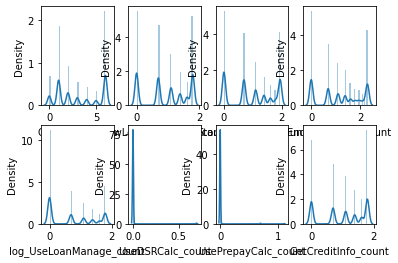

In [133]:
plt.subplot(2, 4, 1) 
sns.distplot(df_clustering_2_int['OpenApp_count'])
plt.subplot(2, 4, 2) 
sns.distplot(df_clustering_2_int['ViewLoanApplyIntro_count'])
plt.subplot(2, 4, 3) 
sns.distplot(df_clustering_2_int['StartLoanApply_count'])
plt.subplot(2, 4, 4) 
sns.distplot(df_clustering_2_int['EndLoanApply_count'])
plt.subplot(2, 4, 5) 
sns.distplot(df_clustering_2_int['log_UseLoanManage_count'])
plt.subplot(2, 4, 6) 
sns.distplot(df_clustering_2_int['UseDSRCalc_count'])
plt.subplot(2, 4, 7) 
sns.distplot(df_clustering_2_int['UsePrepayCalc_count'])
plt.subplot(2, 4, 8) 
sns.distplot(df_clustering_2_int['GetCreditInfo_count'])

<AxesSubplot:xlabel='GetCreditInfo_count', ylabel='Density'>

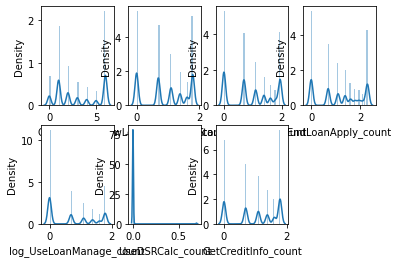

In [134]:
plt.subplot(2, 4, 1) 
sns.distplot(df_clustering_2_int['OpenApp_count'])
plt.subplot(2, 4, 2) 
sns.distplot(df_clustering_2_int['ViewLoanApplyIntro_count'])
plt.subplot(2, 4, 3) 
sns.distplot(df_clustering_2_int['StartLoanApply_count'])
plt.subplot(2, 4, 4) 
sns.distplot(df_clustering_2_int['EndLoanApply_count'])
plt.subplot(2, 4, 5) 
sns.distplot(df_clustering_2_int['log_UseLoanManage_count'])
plt.subplot(2, 4, 6) 
sns.distplot(df_clustering_2_int['UseDSRCalc_count'])
plt.subplot(2, 4, 7) 
sns.distplot(df_clustering_2_int['GetCreditInfo_count'])

In [135]:
from sklearn.preprocessing import LabelEncoder,OneHotEncoder, MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [136]:
scaler_ = MinMaxScaler(feature_range=(0,1))
df_user_scaled_2 = scaler_.fit_transform(df_clustering_2_int)
df_user_scaled_2 = pd.DataFrame(data = df_user_scaled_2, columns = df_clustering_2_int.columns)

In [137]:
df_user_scaled_2

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
0,0.516129,0.926872,0.777778,0.801088,0.000000,0.705128,0.008246,0.166667,0.386853,0.356207,0.00000,0.0,0.0,0.0,0.000000
1,0.974910,1.000000,0.955784,0.000000,0.000000,0.653846,0.004498,0.333333,0.386853,0.356207,0.30103,0.0,0.0,0.0,0.000000
2,0.627240,0.912629,0.666667,0.000000,0.000000,0.717949,0.004498,0.166667,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000
3,0.602151,0.943009,0.777778,0.696370,0.002525,0.551282,0.035232,1.000000,1.000000,1.000000,1.00000,1.0,0.0,0.0,1.000000
4,0.645161,0.950257,0.821993,0.726514,0.025253,0.833333,0.008996,1.000000,1.000000,1.000000,1.00000,1.0,0.0,0.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330186,0.580645,0.934640,0.777778,0.000000,0.000000,0.756410,0.068966,0.166667,0.386853,0.356207,0.30103,0.0,0.0,0.0,0.000000
330187,0.587814,0.950257,0.719680,0.000000,0.000000,0.653846,0.014993,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000
330188,0.741935,0.934640,0.777778,0.000000,0.000000,0.782051,0.027736,0.333333,0.613147,0.564575,0.30103,0.0,0.0,0.0,0.000000
330189,0.892473,0.956652,0.859155,0.763362,0.000000,0.846154,0.011994,0.166667,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.773706


In [138]:
from sklearn.cluster import KMeans

<function matplotlib.pyplot.show(close=None, block=None)>

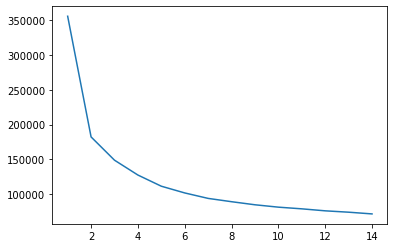

In [139]:
sse = []
for i in range (1,15):
    kmeans = KMeans(n_clusters = i, max_iter = 300)
    kmeans.fit(df_user_scaled_2)
    sse.append(kmeans.inertia_)
    
plt.plot(range(1,15), sse)
plt.show

In [140]:
from yellowbrick.cluster import SilhouetteVisualizer

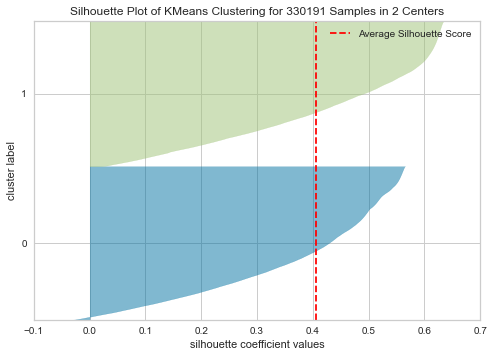

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 330191 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [141]:
kmeans_2 = KMeans(n_clusters = 2, random_state = 1004, init = 'k-means++')

visualizer_2 = SilhouetteVisualizer(kmeans_2, colors = 'yellowbrick')

visualizer_2.fit(df_user_scaled_2)
visualizer_2.show()

SilhouetteVisualizer(ax=<AxesSubplot:>, colors='yellowbrick',
                     estimator=KMeans(n_clusters=3, random_state=1004))

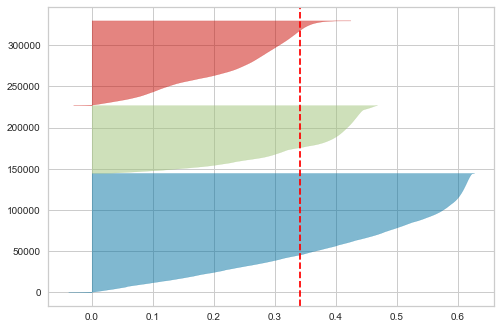

In [142]:
kmeans_3 = KMeans(n_clusters = 3, random_state = 1004, init = 'k-means++')
visualizer_3 = SilhouetteVisualizer(kmeans_3, colors = 'yellowbrick')
visualizer_3.fit(df_user_scaled_2)

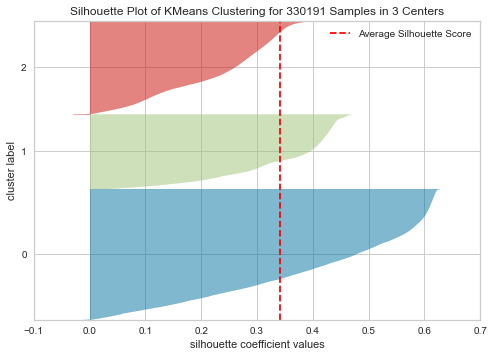

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 330191 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [143]:
kmeans_3 = KMeans(n_clusters = 3, random_state = 1004, init = 'k-means++')

visualizer_3 = SilhouetteVisualizer(kmeans_3, colors = 'yellowbrick')

visualizer_3.fit(df_user_scaled_2)
visualizer_3.show()

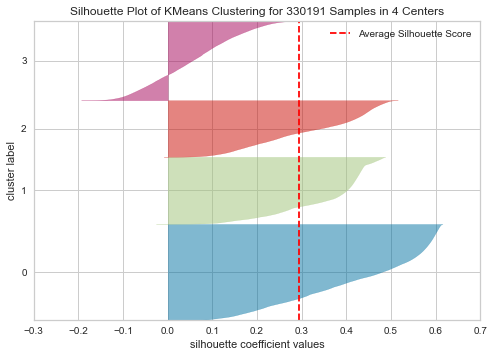

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 330191 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [144]:
kmeans_4 = KMeans(n_clusters = 4, random_state = 1004, init = 'k-means++')

visualizer_4 = SilhouetteVisualizer(kmeans_4, colors = 'yellowbrick')

visualizer_4.fit(df_user_scaled_2)
visualizer_4.show()

<AxesSubplot:>

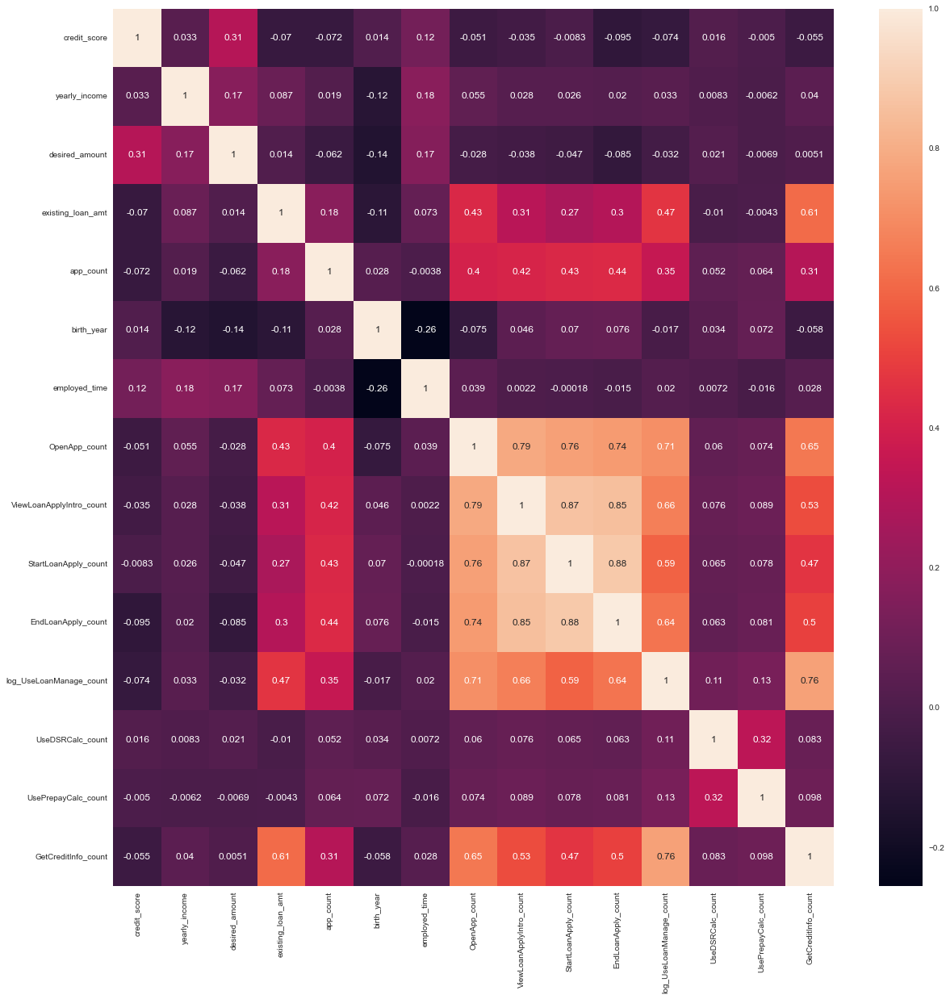

In [146]:
fig = plt.figure(figsize=(20,20))
sns.heatmap(df_user_scaled_2.corr(),annot=True)

In [147]:
df_user_scaled_2

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
0,0.516129,0.926872,0.777778,0.801088,0.000000,0.705128,0.008246,0.166667,0.386853,0.356207,0.00000,0.0,0.0,0.0,0.000000
1,0.974910,1.000000,0.955784,0.000000,0.000000,0.653846,0.004498,0.333333,0.386853,0.356207,0.30103,0.0,0.0,0.0,0.000000
2,0.627240,0.912629,0.666667,0.000000,0.000000,0.717949,0.004498,0.166667,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000
3,0.602151,0.943009,0.777778,0.696370,0.002525,0.551282,0.035232,1.000000,1.000000,1.000000,1.00000,1.0,0.0,0.0,1.000000
4,0.645161,0.950257,0.821993,0.726514,0.025253,0.833333,0.008996,1.000000,1.000000,1.000000,1.00000,1.0,0.0,0.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330186,0.580645,0.934640,0.777778,0.000000,0.000000,0.756410,0.068966,0.166667,0.386853,0.356207,0.30103,0.0,0.0,0.0,0.000000
330187,0.587814,0.950257,0.719680,0.000000,0.000000,0.653846,0.014993,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000
330188,0.741935,0.934640,0.777778,0.000000,0.000000,0.782051,0.027736,0.333333,0.613147,0.564575,0.30103,0.0,0.0,0.0,0.000000
330189,0.892473,0.956652,0.859155,0.763362,0.000000,0.846154,0.011994,0.166667,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.773706


In [148]:
from sklearn.decomposition import PCA

In [150]:
pca = PCA(n_components=10)

printcipalComponents = pca.fit_transform(df_user_scaled_2)

principalDf = pd.DataFrame(data=printcipalComponents, columns = [1,2,3,4,5,6,7,8,9,10])

pca.explained_variance_ratio_

array([0.63546381, 0.14050281, 0.05880734, 0.03379488, 0.02904432,
       0.0243753 , 0.01826137, 0.01700964, 0.01333604, 0.00986553])

In [151]:
loading = pca.components_

In [152]:
pd.reset_option('display.float_format')
print(loading)

[[ 1.28827762e-02 -5.75624616e-03  3.69673260e-03 -2.23594430e-01
  -5.46777763e-03  4.63571319e-04 -1.14313791e-03 -4.09837648e-01
  -4.10727244e-01 -3.95290290e-01 -3.94139794e-01 -4.14828765e-01
  -9.35445716e-03 -1.00405465e-02 -3.59479854e-01]
 [ 1.83281248e-02 -1.45539836e-02 -1.17271864e-02 -5.72279494e-01
   2.40314399e-03  6.19992021e-02 -7.78195079e-03  4.17060164e-02
   2.95563346e-01  3.86284084e-01  3.25807804e-01 -2.67365388e-01
   7.99192520e-04  6.44399375e-04 -5.01948377e-01]
 [ 6.36267489e-03 -3.02851718e-02 -3.23061876e-03 -7.32347516e-01
   6.63824224e-05  2.87575995e-02 -9.16737383e-03 -1.26521886e-02
  -7.20068339e-02 -2.03122578e-01 -1.28660335e-01  5.76799591e-01
   4.40599427e-02  4.20225112e-02  2.49450787e-01]
 [ 1.30033194e-01  4.51487161e-02  4.86448102e-02 -1.46474955e-01
  -8.62055884e-04 -2.60251927e-01  2.86529084e-02  8.17543626e-01
  -1.84628601e-02 -1.15659212e-01 -3.52909996e-01 -2.83660109e-01
  -1.75636678e-02 -2.35023996e-02  2.67218145e-02]
 [-1

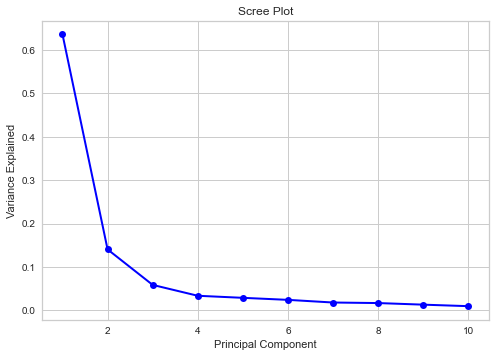

In [153]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

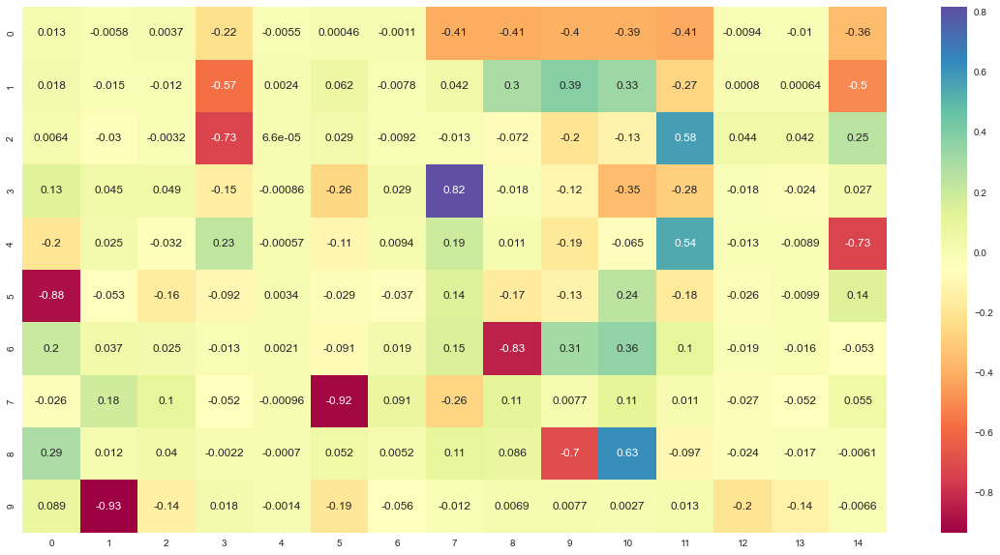

In [154]:
fig = plt.figure(figsize=(20,10))
ax = sns.heatmap(loading, annot=True, cmap='Spectral')
plt.show()

In [155]:
df_user_scaled_2

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
0,0.516129,0.926872,0.777778,0.801088,0.000000,0.705128,0.008246,0.166667,0.386853,0.356207,0.00000,0.0,0.0,0.0,0.000000
1,0.974910,1.000000,0.955784,0.000000,0.000000,0.653846,0.004498,0.333333,0.386853,0.356207,0.30103,0.0,0.0,0.0,0.000000
2,0.627240,0.912629,0.666667,0.000000,0.000000,0.717949,0.004498,0.166667,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000
3,0.602151,0.943009,0.777778,0.696370,0.002525,0.551282,0.035232,1.000000,1.000000,1.000000,1.00000,1.0,0.0,0.0,1.000000
4,0.645161,0.950257,0.821993,0.726514,0.025253,0.833333,0.008996,1.000000,1.000000,1.000000,1.00000,1.0,0.0,0.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330186,0.580645,0.934640,0.777778,0.000000,0.000000,0.756410,0.068966,0.166667,0.386853,0.356207,0.30103,0.0,0.0,0.0,0.000000
330187,0.587814,0.950257,0.719680,0.000000,0.000000,0.653846,0.014993,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000
330188,0.741935,0.934640,0.777778,0.000000,0.000000,0.782051,0.027736,0.333333,0.613147,0.564575,0.30103,0.0,0.0,0.0,0.000000
330189,0.892473,0.956652,0.859155,0.763362,0.000000,0.846154,0.011994,0.166667,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.773706


In [156]:
result_3 = kmeans_3.predict(df_user_scaled_2)
df_user_scaled_2['cluster']=result_3

In [157]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    sns.scatterplot(xs * scalex,ys * scaley, hue = df_user_scaled_2.cluster, palette=['green','blue','red'])
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))

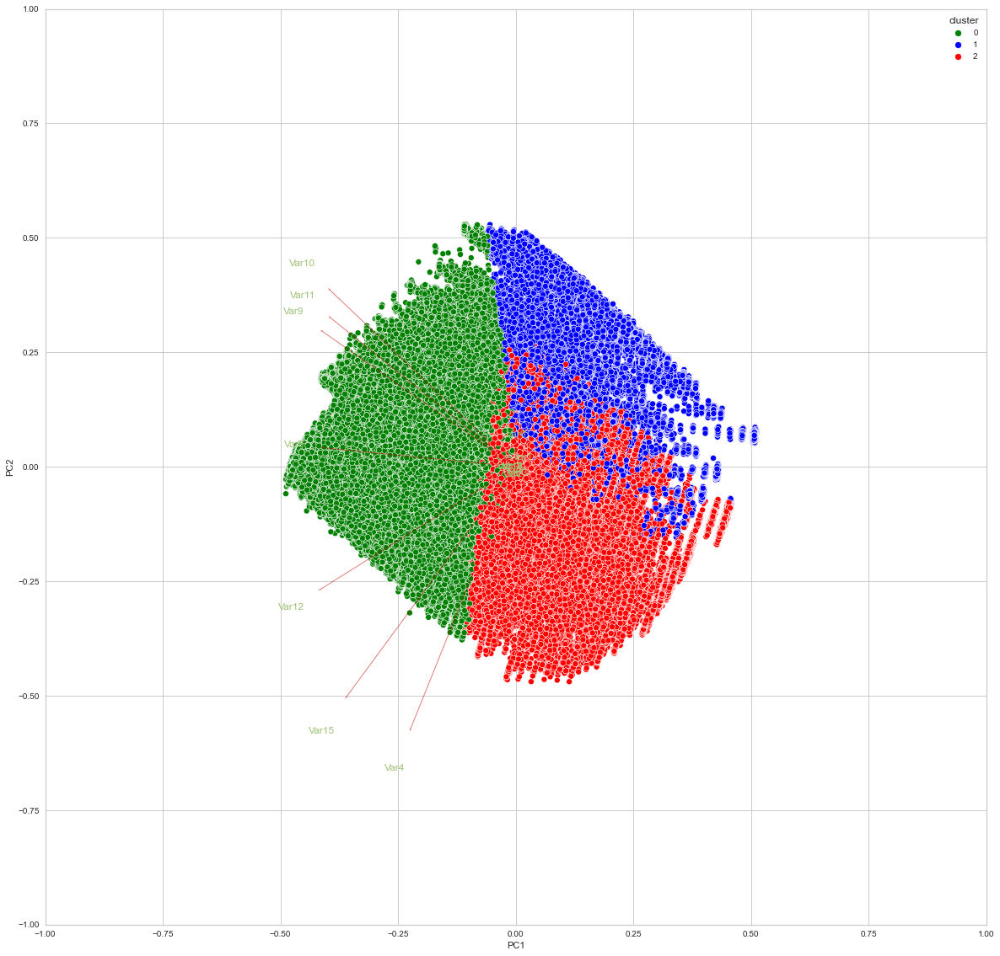

In [158]:
#Call the function. Use only the 2 PCs.
fig = plt.figure(figsize = (20,20))
myplot(printcipalComponents[:,0:2],np.transpose(pca.components_[0:2, :]))
plt.show()

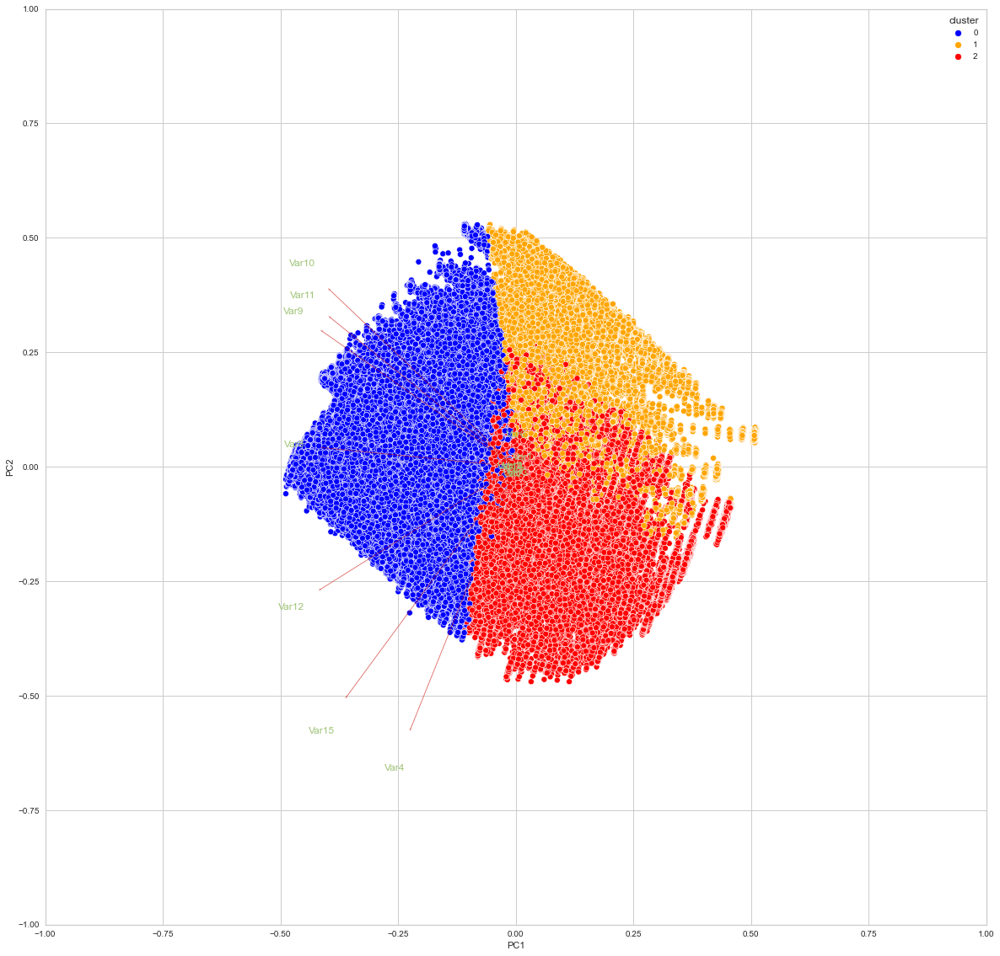

In [159]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    sns.scatterplot(xs * scalex,ys * scaley, hue = df_user_scaled_2.cluster, palette=['blue','orange','red'])
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
#Call the function. Use only the 2 PCs.
fig = plt.figure(figsize = (20,20))
myplot(printcipalComponents[:,0:2],np.transpose(pca.components_[0:2, :]))
plt.show()

In [160]:
df_user_scaled_2

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,cluster
0,0.516129,0.926872,0.777778,0.801088,0.000000,0.705128,0.008246,0.166667,0.386853,0.356207,0.00000,0.0,0.0,0.0,0.000000,2
1,0.974910,1.000000,0.955784,0.000000,0.000000,0.653846,0.004498,0.333333,0.386853,0.356207,0.30103,0.0,0.0,0.0,0.000000,1
2,0.627240,0.912629,0.666667,0.000000,0.000000,0.717949,0.004498,0.166667,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000,1
3,0.602151,0.943009,0.777778,0.696370,0.002525,0.551282,0.035232,1.000000,1.000000,1.000000,1.00000,1.0,0.0,0.0,1.000000,0
4,0.645161,0.950257,0.821993,0.726514,0.025253,0.833333,0.008996,1.000000,1.000000,1.000000,1.00000,1.0,0.0,0.0,1.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330186,0.580645,0.934640,0.777778,0.000000,0.000000,0.756410,0.068966,0.166667,0.386853,0.356207,0.30103,0.0,0.0,0.0,0.000000,1
330187,0.587814,0.950257,0.719680,0.000000,0.000000,0.653846,0.014993,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.000000,1
330188,0.741935,0.934640,0.777778,0.000000,0.000000,0.782051,0.027736,0.333333,0.613147,0.564575,0.30103,0.0,0.0,0.0,0.000000,1
330189,0.892473,0.956652,0.859155,0.763362,0.000000,0.846154,0.011994,0.166667,0.000000,0.000000,0.00000,0.0,0.0,0.0,0.773706,2


In [161]:
df_clustered = pd.concat([df_user_scaled_2,df_clustering_2_str],axis=1)

In [162]:
cluster0 = df_user_scaled_2[df_user_scaled_2['cluster']==0]
cluster1 = df_user_scaled_2[df_user_scaled_2['cluster']==1]
cluster2 = df_user_scaled_2[df_user_scaled_2['cluster']==2]

In [163]:
cluster0.describe()

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,cluster
count,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.000000,144880.0
mean,0.617658,0.933149,0.788098,0.699233,0.008429,0.672026,0.035081,0.875689,0.869195,0.825198,0.826911,0.742951,0.016462,0.016882,0.847381,0.0
std,0.135333,0.089973,0.066176,0.214317,0.013970,0.136530,0.046064,0.219386,0.184056,0.227911,0.213597,0.301229,0.127244,0.114722,0.232292,0.0
min,0.032258,0.000000,0.000000,0.000000,0.000000,0.012821,0.004498,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.537634,0.924743,0.744330,0.724028,0.000000,0.576923,0.007496,0.833333,0.773706,0.712414,0.698970,0.613147,0.000000,0.000000,0.773706,0.0
50%,0.591398,0.943009,0.777778,0.760139,0.005051,0.679487,0.016492,1.000000,1.000000,0.920782,0.903090,0.898244,0.000000,0.000000,1.000000,0.0
75%,0.677419,0.962371,0.830791,0.788577,0.010101,0.782051,0.041229,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.0
max,1.000000,1.000000,1.000000,0.988919,1.000000,0.987179,0.473013,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0


In [164]:
cluster1.describe()

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,cluster
count,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.000000,82364.0
mean,0.650015,0.918351,0.794524,0.000328,0.000518,0.687185,0.031987,0.196613,0.273510,0.268661,0.263186,0.027601,0.002805,0.002136,0.116029,1.0
std,0.157491,0.136734,0.083280,0.014033,0.001436,0.148425,0.044324,0.212949,0.282904,0.279893,0.275025,0.109223,0.052885,0.039644,0.210563,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.012821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,0.559140,0.922526,0.744330,0.000000,0.000000,0.589744,0.006747,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
50%,0.637993,0.939814,0.797343,0.000000,0.000000,0.705128,0.014243,0.166667,0.386853,0.356207,0.301030,0.000000,0.000000,0.000000,0.000000,1.0
75%,0.738351,0.962371,0.838230,0.000000,0.000000,0.807692,0.037481,0.333333,0.386853,0.356207,0.477121,0.000000,0.000000,0.000000,0.386853,1.0
max,1.000000,1.000000,1.000000,0.600816,0.030303,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0


In [165]:
cluster2.describe()

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,cluster
count,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.000000,102947.0
mean,0.627307,0.931510,0.794782,0.752204,0.000664,0.667001,0.034683,0.295414,0.274161,0.235663,0.261939,0.210317,0.001894,0.001599,0.528830,2.0
std,0.182459,0.090820,0.077598,0.087641,0.001656,0.137741,0.046645,0.207421,0.262868,0.248259,0.257629,0.269369,0.043481,0.035099,0.295932,0.0
min,0.021505,0.000000,0.000000,0.000000,0.000000,0.000000,0.004498,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0
25%,0.548387,0.924743,0.744330,0.728865,0.000000,0.576923,0.006747,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.386853,2.0
50%,0.612903,0.943009,0.797343,0.760317,0.000000,0.679487,0.015742,0.166667,0.386853,0.356207,0.301030,0.000000,0.000000,0.000000,0.613147,2.0
75%,0.720430,0.962371,0.838230,0.791924,0.000000,0.769231,0.041229,0.333333,0.386853,0.356207,0.477121,0.386853,0.000000,0.000000,0.773706,2.0
max,1.000000,1.000000,1.000000,1.000000,0.063131,0.987179,0.970765,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.0


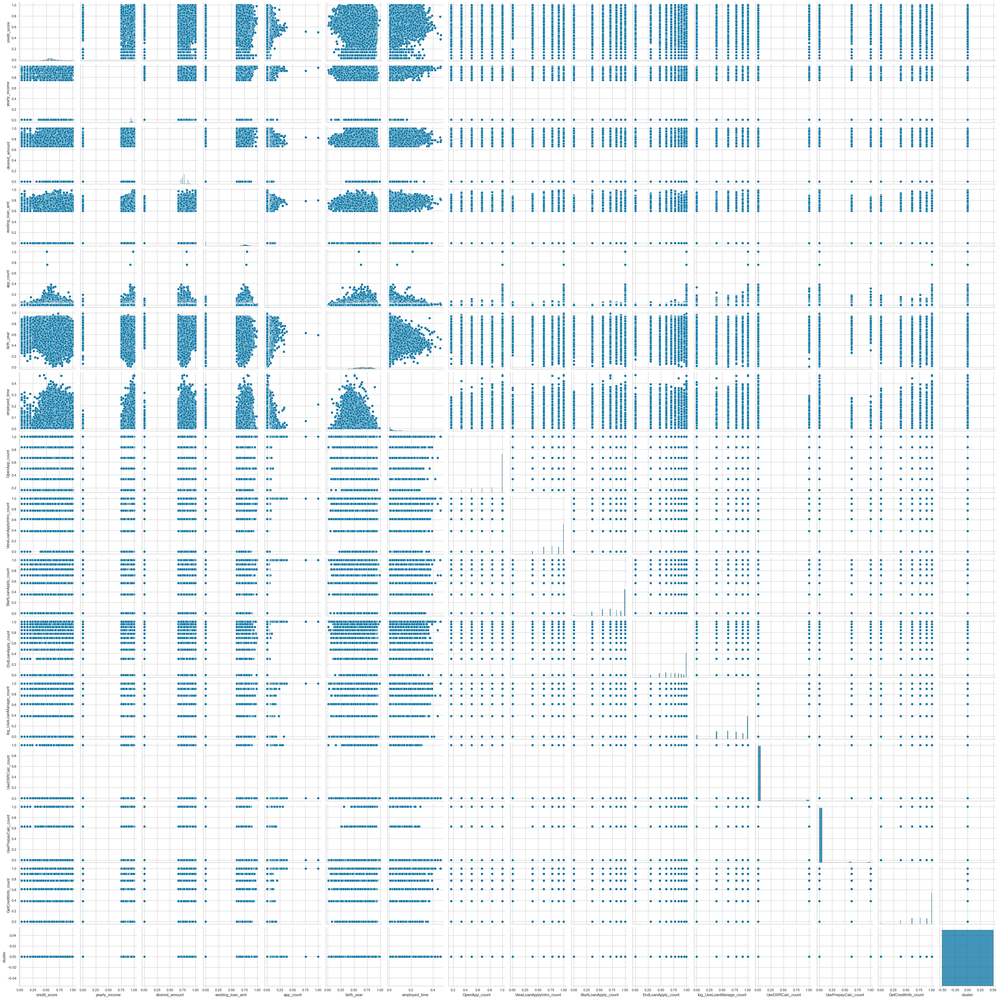

In [166]:
sns.pairplot(cluster0)

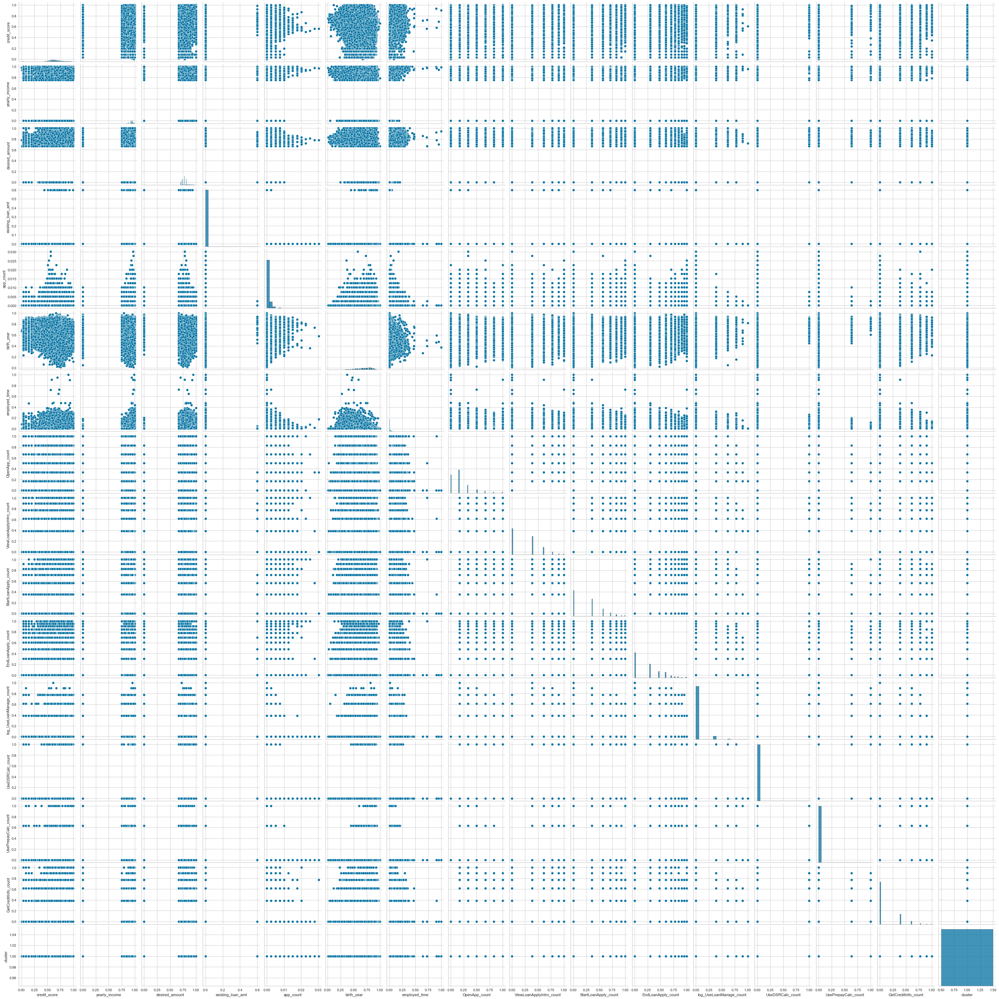

In [167]:
sns.pairplot(cluster1)

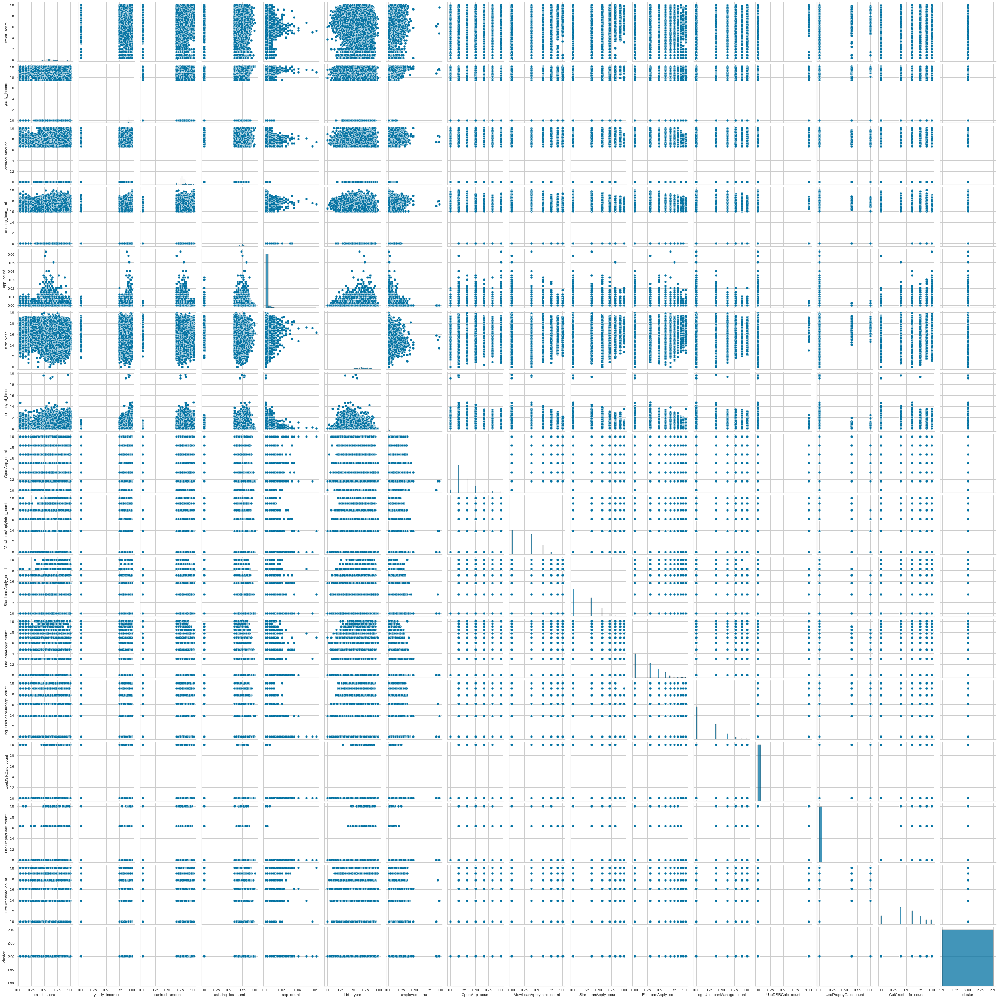

In [168]:
sns.pairplot(cluster2)

In [169]:
cluster0_index = cluster0.index
cluster0_index = np.array(cluster0_index)

cluster0_str = df_clustering_2_str.iloc[cluster0_index]

cluster0_merge = pd.concat([cluster0,cluster0_str],axis=1)

In [170]:
cluster0_merge

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,...,income_type,existing_loan_cnt,employment_type,houseown_type,purpose,Month,gender,rehab_group,loan_rate,is_applied
3,0.602151,0.943009,0.777778,0.696370,0.002525,0.551282,0.035232,1.000000,1.000000,1.000000,...,EARNEDINCOME,1.791759,계약직,전월세,SWITCHLOAN,05,M,A,NaN,NaN
4,0.645161,0.950257,0.821993,0.726514,0.025253,0.833333,0.008996,1.000000,1.000000,1.000000,...,EARNEDINCOME,1.791759,정규직,전월세,SWITCHLOAN,05,M,A,12.484615,1.0
6,0.086022,0.994280,0.883805,0.648593,0.012626,0.628205,0.004498,1.000000,1.000000,1.000000,...,OTHERINCOME,0.693147,ETC,전월세,LIVING,05,M,A,NaN,NaN
7,0.623656,0.875000,0.777778,0.783672,0.116162,0.589744,0.182909,1.000000,1.000000,1.000000,...,EARNEDINCOME,2.079442,정규직,전월세,LIVING,05,M,A,6.980000,1.0
8,0.763441,0.912629,0.864239,0.778873,0.010101,0.512821,0.004498,1.000000,1.000000,1.000000,...,OTHERINCOME,0.693147,ETC,자가,SWITCHLOAN,05,M,A,12.750000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330148,1.000000,0.995473,0.945017,0.000000,0.000000,0.551282,0.183658,0.333333,0.613147,0.827087,...,EARNEDINCOME,0.000000,정규직,자가,SWITCHLOAN,03,M,D,9.731579,0.0
330161,0.698925,0.939814,0.777778,0.797462,0.000000,0.512821,0.029235,0.666667,0.613147,1.000000,...,EARNEDINCOME,2.197225,정규직,기타가족소유,LIVING,03,M,D,15.750000,1.0
330165,0.494624,0.944538,0.777778,0.795032,0.000000,0.705128,0.008996,0.166667,0.613147,0.712414,...,EARNEDINCOME,1.098612,정규직,자가,INVEST,03,M,D,NaN,NaN
330174,0.580645,0.962371,0.777778,0.835770,0.000000,0.756410,0.094453,0.833333,0.386853,0.564575,...,EARNEDINCOME,1.609438,정규직,자가,LIVING,03,M,D,16.441667,0.0


In [171]:
cluster1_index = cluster1.index
cluster1_index = np.array(cluster1_index)

cluster1_str = df_clustering_2_str.iloc[cluster1_index]

cluster1_merge = pd.concat([cluster1,cluster1_str],axis=1)

In [172]:
cluster1_merge

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,...,income_type,existing_loan_cnt,employment_type,houseown_type,purpose,Month,gender,rehab_group,loan_rate,is_applied
1,0.974910,1.000000,0.955784,0.0,0.0,0.653846,0.004498,0.333333,0.386853,0.356207,...,EARNEDINCOME,0.0,정규직,전월세,HOUSEDEPOSIT,05,M,B,10.281250,0.0
2,0.627240,0.912629,0.666667,0.0,0.0,0.717949,0.004498,0.166667,0.000000,0.000000,...,OTHERINCOME,0.0,ETC,기타가족소유,LIVING,05,U,A,NaN,NaN
25,0.602151,0.950257,0.830791,0.0,0.0,0.564103,0.052474,0.166667,0.386853,0.356207,...,FREELANCER,0.0,ETC,기타가족소유,SWITCHLOAN,05,F,A,14.600000,0.0
28,0.663082,0.934640,0.744330,0.0,0.0,0.756410,0.028486,0.000000,0.000000,0.000000,...,EARNEDINCOME,0.0,계약직,기타가족소유,LIVING,05,M,A,12.680357,0.0
31,0.831541,1.000000,0.922337,0.0,0.0,0.602564,0.035982,0.000000,0.000000,0.000000,...,EARNEDINCOME,0.0,정규직,자가,HOUSEDEPOSIT,05,M,A,9.192982,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330180,0.086022,0.960155,0.666667,0.0,0.0,0.628205,0.036732,0.166667,0.613147,0.564575,...,PRIVATEBUSINESS,0.0,정규직,기타가족소유,LIVING,03,M,D,NaN,NaN
330186,0.580645,0.934640,0.777778,0.0,0.0,0.756410,0.068966,0.166667,0.386853,0.356207,...,EARNEDINCOME,0.0,정규직,전월세,LIVING,03,M,D,15.500000,1.0
330187,0.587814,0.950257,0.719680,0.0,0.0,0.653846,0.014993,0.000000,0.000000,0.000000,...,FREELANCER,0.0,ETC,전월세,LIVING,03,M,D,NaN,NaN
330188,0.741935,0.934640,0.777778,0.0,0.0,0.782051,0.027736,0.333333,0.613147,0.564575,...,EARNEDINCOME,0.0,정규직,기타가족소유,LIVING,03,F,D,13.223077,0.0


In [173]:
cluster2_index = cluster2.index
cluster2_index = np.array(cluster2_index)

cluster2_str = df_clustering_2_str.iloc[cluster2_index]

cluster2_merge = pd.concat([cluster2,cluster2_str],axis=1)

In [174]:
cluster1_merge['is_applied'].value_counts() #48%

0.0    32247
1.0    28808
Name: is_applied, dtype: int64

In [175]:
df_clustered

,credit_score,yearly_income,desired_amount,existing_loan_amt,app_count,birth_year,employed_time,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,...,income_type,existing_loan_cnt,employment_type,houseown_type,purpose,Month,gender,rehab_group,loan_rate,is_applied
0,0.516129,0.926872,0.777778,0.801088,0.000000,0.705128,0.008246,0.166667,0.386853,0.356207,...,PRACTITIONER,1.945910,계약직,전월세,LIVING,05,F,B,NaN,NaN
1,0.974910,1.000000,0.955784,0.000000,0.000000,0.653846,0.004498,0.333333,0.386853,0.356207,...,EARNEDINCOME,0.000000,정규직,전월세,HOUSEDEPOSIT,05,M,B,10.281250,0.0
2,0.627240,0.912629,0.666667,0.000000,0.000000,0.717949,0.004498,0.166667,0.000000,0.000000,...,OTHERINCOME,0.000000,ETC,기타가족소유,LIVING,05,U,A,NaN,NaN
3,0.602151,0.943009,0.777778,0.696370,0.002525,0.551282,0.035232,1.000000,1.000000,1.000000,...,EARNEDINCOME,1.791759,계약직,전월세,SWITCHLOAN,05,M,A,NaN,NaN
4,0.645161,0.950257,0.821993,0.726514,0.025253,0.833333,0.008996,1.000000,1.000000,1.000000,...,EARNEDINCOME,1.791759,정규직,전월세,SWITCHLOAN,05,M,A,12.484615,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330186,0.580645,0.934640,0.777778,0.000000,0.000000,0.756410,0.068966,0.166667,0.386853,0.356207,...,EARNEDINCOME,0.000000,정규직,전월세,LIVING,03,M,D,15.500000,1.0
330187,0.587814,0.950257,0.719680,0.000000,0.000000,0.653846,0.014993,0.000000,0.000000,0.000000,...,FREELANCER,0.000000,ETC,전월세,LIVING,03,M,D,NaN,NaN
330188,0.741935,0.934640,0.777778,0.000000,0.000000,0.782051,0.027736,0.333333,0.613147,0.564575,...,EARNEDINCOME,0.000000,정규직,기타가족소유,LIVING,03,F,D,13.223077,0.0
330189,0.892473,0.956652,0.859155,0.763362,0.000000,0.846154,0.011994,0.166667,0.000000,0.000000,...,EARNEDINCOME,1.386294,정규직,자가,SWITCHLOAN,03,M,D,14.496875,0.0


<AxesSubplot:xlabel='app_count', ylabel='Density'>

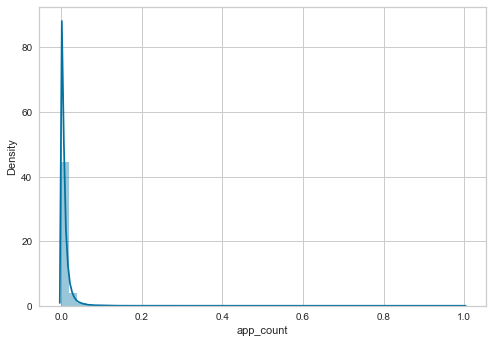

In [176]:
sns.distplot(cluster0_merge['app_count'])

In [177]:
cluster0_merge['is_applied'].value_counts() #54%

1.0    60525
0.0    43437
Name: is_applied, dtype: int64

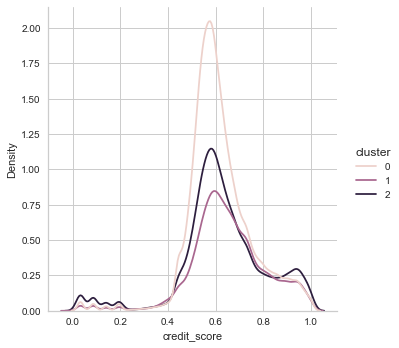

In [178]:
sns.displot(df_clustered, x="credit_score", hue="cluster", kind="kde")

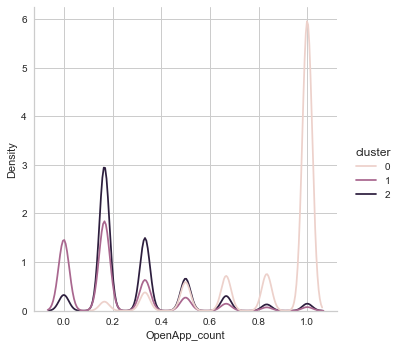

In [179]:
sns.displot(df_clustered, x='OpenApp_count', hue="cluster", kind="kde")

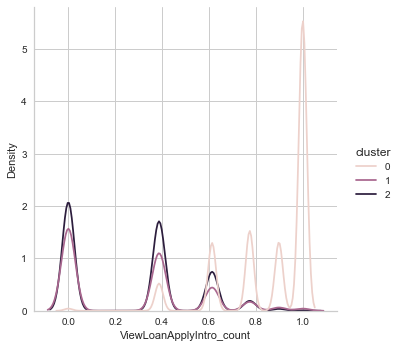

In [180]:
sns.displot(df_clustered, x='ViewLoanApplyIntro_count', hue="cluster", kind="kde")

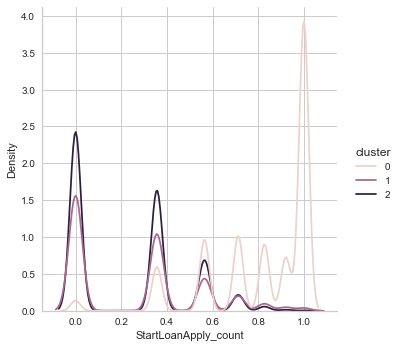

In [181]:
sns.displot(df_clustered, x='StartLoanApply_count', hue="cluster", kind="kde")

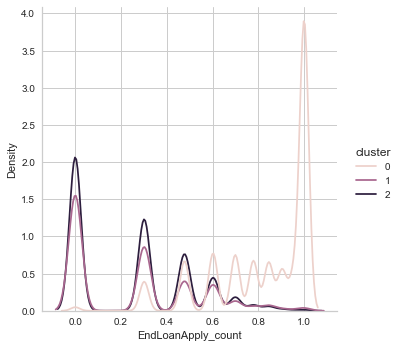

In [182]:
sns.displot(df_clustered, x='EndLoanApply_count', hue="cluster", kind="kde")

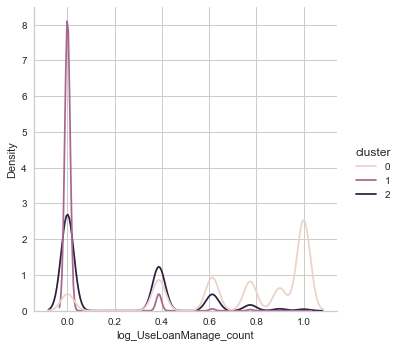

In [183]:
sns.displot(df_clustered, x='log_UseLoanManage_count', hue="cluster", kind="kde")

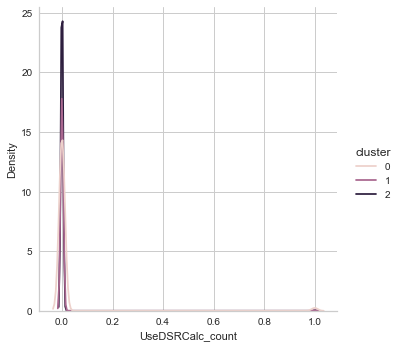

In [184]:
sns.displot(df_clustered, x='UseDSRCalc_count', hue="cluster", kind="kde")

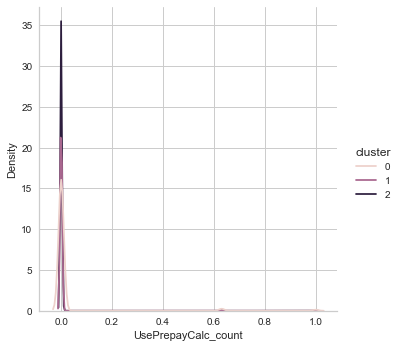

In [185]:
sns.displot(df_clustered, x='UsePrepayCalc_count', hue="cluster", kind="kde")

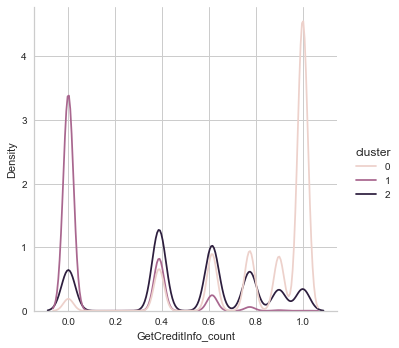

In [186]:
sns.displot(df_clustered, x='GetCreditInfo_count', hue="cluster", kind="kde")

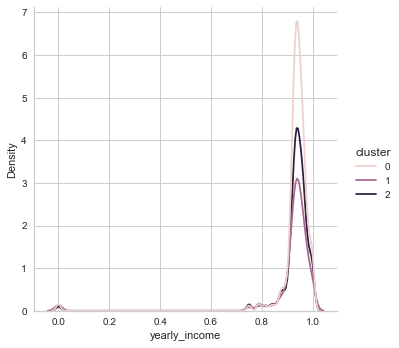

In [187]:
sns.displot(df_clustered, x='yearly_income', hue="cluster", kind="kde")

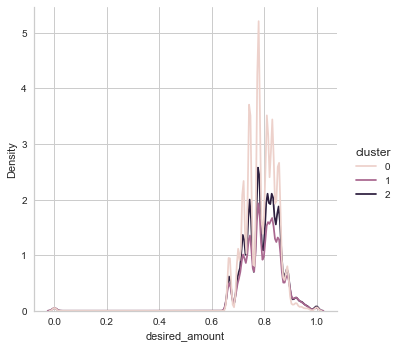

In [188]:
sns.displot(df_clustered, x='desired_amount', hue="cluster", kind="kde")

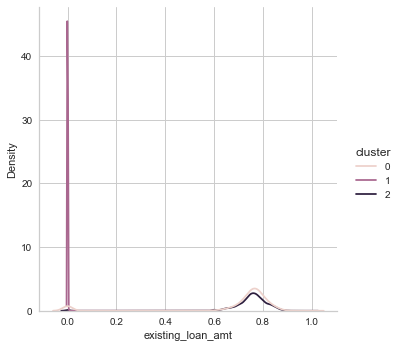

In [189]:
sns.displot(df_clustered, x='existing_loan_amt', hue="cluster", kind="kde")

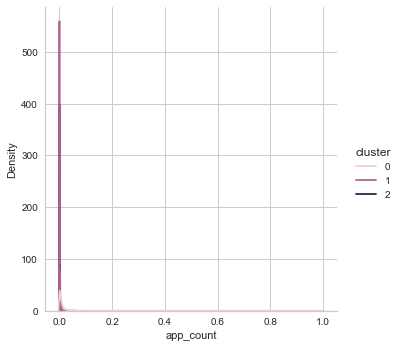

In [190]:
sns.displot(df_clustered, x='app_count', hue="cluster", kind="kde")

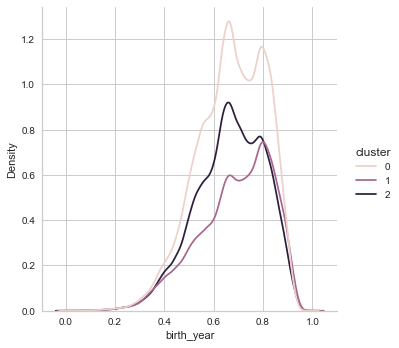

In [191]:
sns.displot(df_clustered, x='birth_year', hue="cluster", kind="kde")

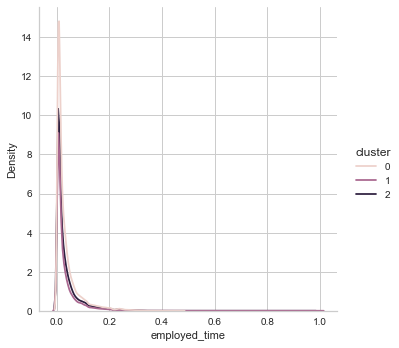

In [192]:
sns.displot(data = df_clustered, x='employed_time', hue="cluster", kind="kde")

<AxesSubplot:xlabel='income_type', ylabel='count'>

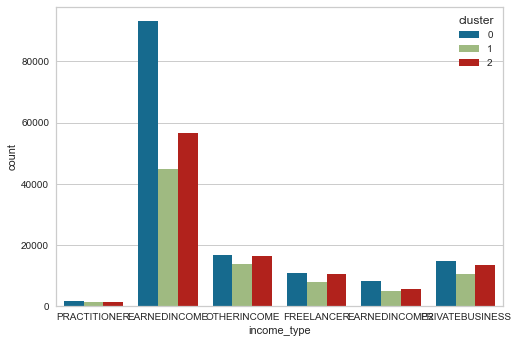

In [193]:
sns.countplot(data =df_clustered, x='income_type', hue="cluster")

<AxesSubplot:xlabel='existing_loan_cnt', ylabel='count'>

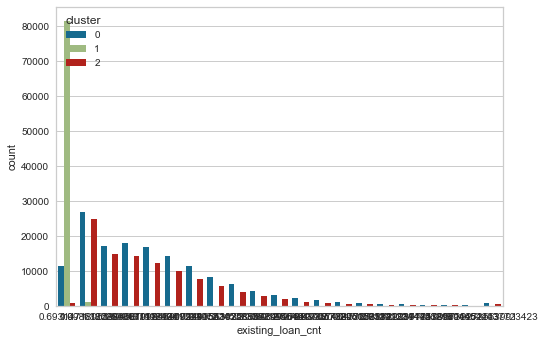

In [194]:
sns.countplot(data =df_clustered, x='existing_loan_cnt', hue="cluster")

<AxesSubplot:xlabel='employment_type', ylabel='count'>

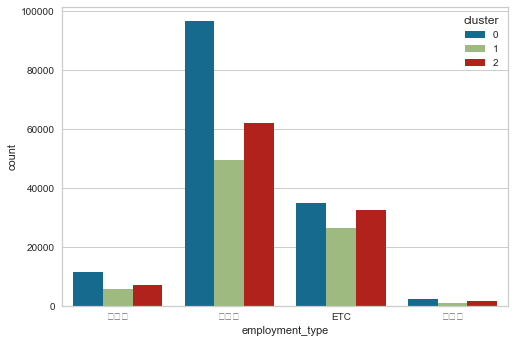

In [195]:
sns.countplot(data =df_clustered, x='employment_type', hue="cluster")

<AxesSubplot:xlabel='houseown_type', ylabel='count'>

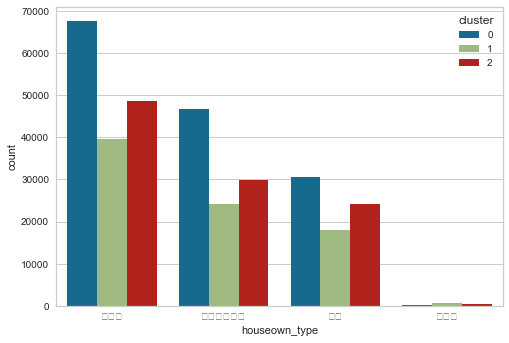

In [196]:
sns.countplot(data =df_clustered, x='houseown_type', hue="cluster")

<AxesSubplot:xlabel='purpose', ylabel='count'>

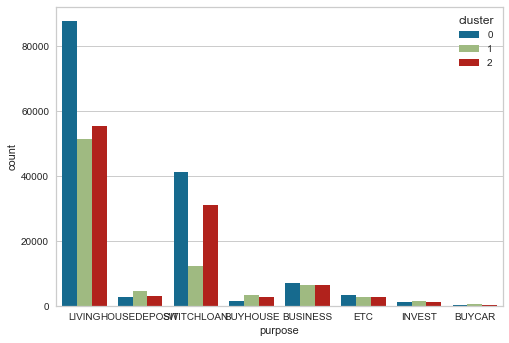

In [197]:
sns.countplot(data =df_clustered, x='purpose', hue="cluster")

<AxesSubplot:xlabel='employed_time', ylabel='count'>

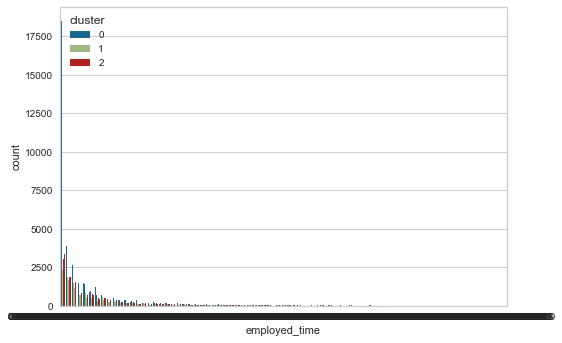

In [198]:
sns.countplot(data =df_clustered, x='employed_time', hue="cluster")

<AxesSubplot:xlabel='gender', ylabel='count'>

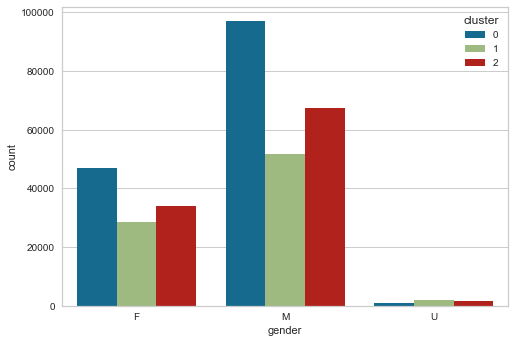

In [199]:
sns.countplot(data =df_clustered, x='gender', hue="cluster")

<AxesSubplot:xlabel='rehab_group', ylabel='count'>

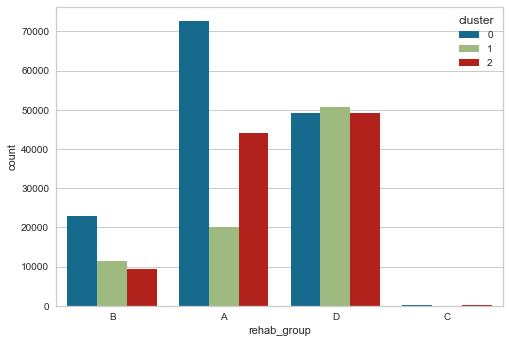

In [200]:
sns.countplot(data =df_clustered, x='rehab_group', hue="cluster")

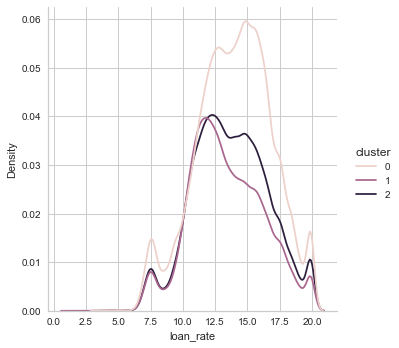

In [201]:
sns.displot(df_clustered, x='loan_rate', hue="cluster", kind="kde")

# log만 존재하는 회원

In [202]:
spec_id = df_clustering_2['user_id'].unique()

In [203]:
spec_n_log = log.loc[log['user_id'].isin(spec_id)]

In [204]:
spec_n_log = spec_n_log['user_id'].unique()

In [205]:
only_log = log_1.loc[~log_1['user_id'].isin(spec_n_log)]

In [206]:
only_log.describe()

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
count,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000
mean,439448.606271,2.188098,0.392674,0.220129,0.004954,0.769128,0.003925,0.004970,1.384471
std,253848.951066,1.665144,0.845106,0.629380,0.131777,1.368913,0.062531,0.086772,1.517021
min,21.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,219151.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,439766.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,659099.000000,3.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000
max,879698.000000,6.000000,5.000000,6.000000,9.000000,5.000000,1.000000,2.000000,5.000000


In [207]:
only_log

,user_id,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
29,679385,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
36,269916,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
41,32562,6.0,3.0,0.0,0.0,4.0,0.0,0.0,5.0
46,753034,3.0,4.0,3.0,0.0,5.0,0.0,0.0,5.0
51,98193,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
479764,105787,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
479765,418147,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
479767,877407,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
479770,319584,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


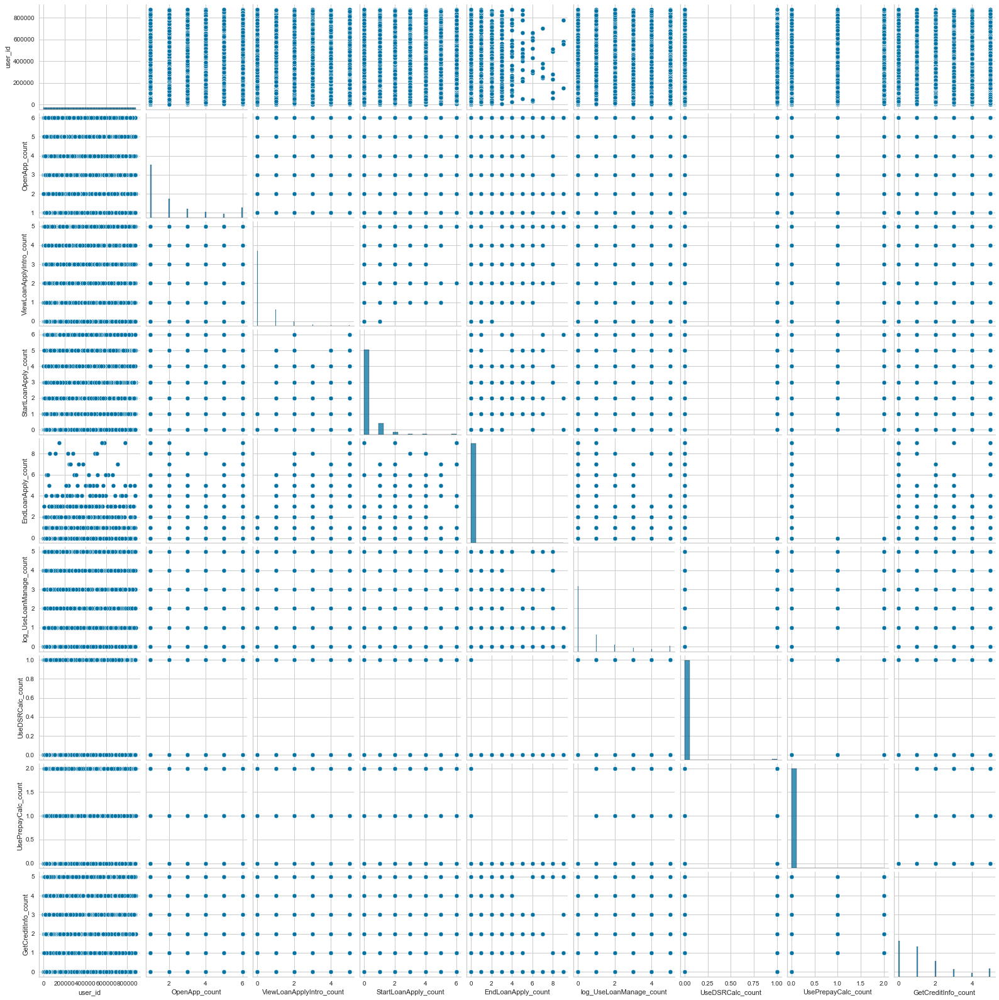

In [208]:
sns.pairplot(only_log)

In [209]:
only_log_sc = only_log

In [210]:
only_log_sc = only_log_sc.drop(['user_id'],axis=1)

<function matplotlib.pyplot.show(close=None, block=None)>

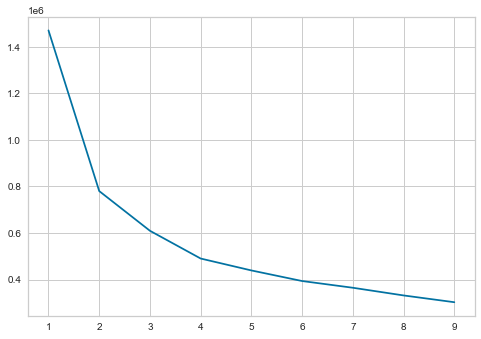

In [211]:
sse = []
for i in range (1,10):
    kmeans = KMeans(n_clusters = i, max_iter = 300)
    kmeans.fit(only_log_sc)
    sse.append(kmeans.inertia_)
    
plt.plot(range(1,10), sse)
plt.show

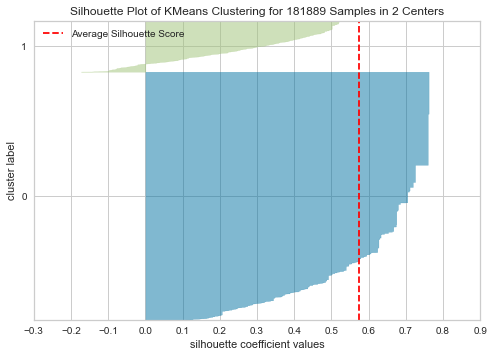

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 181889 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [212]:
ol_kmeans_2 = KMeans(n_clusters = 2, random_state = 1004, init = 'k-means++')

ol_visualizer_2 = SilhouetteVisualizer(ol_kmeans_2, colors = 'yellowbrick')

ol_visualizer_2.fit(only_log_sc)
ol_visualizer_2.show()

In [213]:
ol_kmeans_2

KMeans(n_clusters=2, random_state=1004)

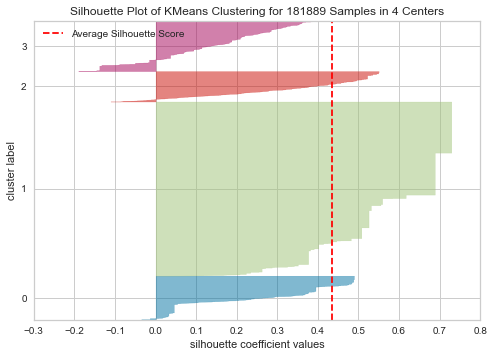

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 181889 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [214]:
ol_kmeans_4 = KMeans(n_clusters = 4, random_state = 1004, init = 'k-means++')

ol_visualizer_4 = SilhouetteVisualizer(ol_kmeans_4, colors = 'yellowbrick')

ol_visualizer_4.fit(only_log_sc)
ol_visualizer_4.show()

<AxesSubplot:>

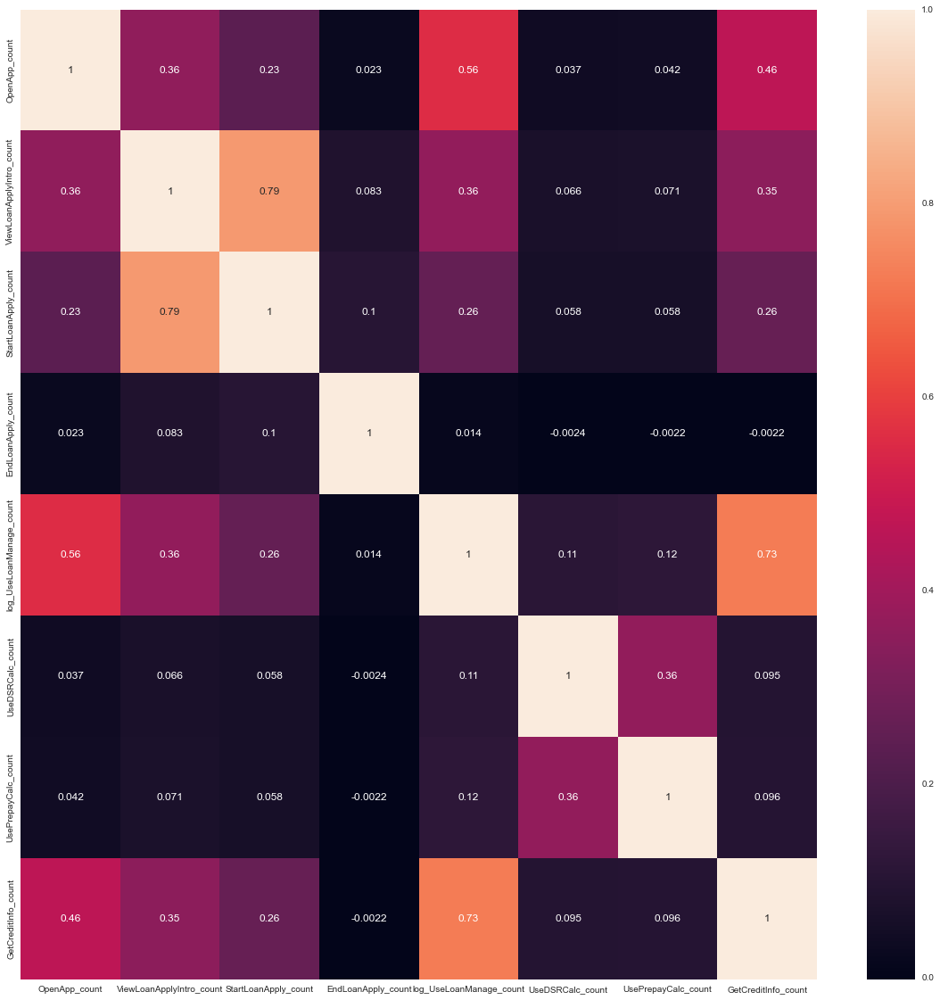

In [215]:
fig = plt.figure(figsize=(20,20))
sns.heatmap(only_log_sc.corr(),annot=True)

In [216]:
only_log_sc.describe()

,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count
count,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000,181889.000000
mean,2.188098,0.392674,0.220129,0.004954,0.769128,0.003925,0.004970,1.384471
std,1.665144,0.845106,0.629380,0.131777,1.368913,0.062531,0.086772,1.517021
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,3.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000
max,6.000000,5.000000,6.000000,9.000000,5.000000,1.000000,2.000000,5.000000


In [217]:
pca1 = PCA(n_components=5)

printcipalComponents = pca1.fit_transform(only_log_sc)

principalDf = pd.DataFrame(data=printcipalComponents, columns = [1,2,3,4,5])

pca1.explained_variance_ratio_

array([0.63726751, 0.17924347, 0.10078748, 0.06659898, 0.01258945])

In [218]:
loading = pca1.components_
loading

array([[ 6.04848520e-01,  1.84890726e-01,  1.01239743e-01,
         1.31033664e-03,  5.22530280e-01,  2.57087407e-03,
         3.76141192e-03,  5.62728917e-01],
       [-7.70854850e-01, -1.43860742e-02,  8.93800539e-03,
        -2.49189327e-03,  2.79415647e-01,  3.30057652e-03,
         4.39939891e-03,  5.72176888e-01],
       [-1.31680828e-01,  7.84801827e-01,  5.83016044e-01,
         1.41086817e-02, -1.23839729e-01,  1.74467075e-03,
         2.52423121e-03, -1.06272269e-01],
       [-1.47446486e-01,  1.56978746e-02,  7.48734193e-03,
         3.24841947e-03,  7.95799876e-01,  3.28410688e-03,
         5.50420217e-03, -5.87033196e-01],
       [ 2.91862698e-02, -5.91131329e-01,  8.05683801e-01,
         1.93751342e-02,  1.34037067e-02,  7.67728855e-04,
        -7.64710517e-04,  5.41269325e-03]])

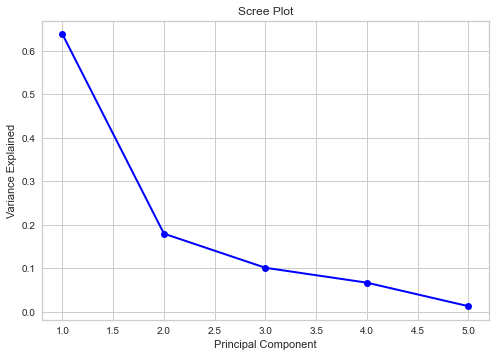

In [219]:
PC_values = np.arange(pca1.n_components_) + 1
plt.plot(PC_values, pca1.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

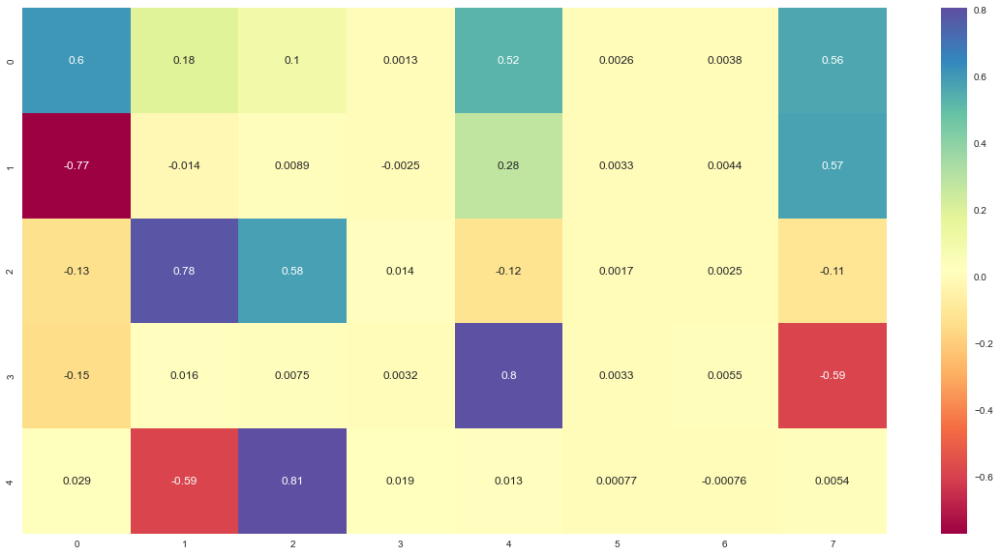

In [220]:
fig = plt.figure(figsize=(20,10))
ax = sns.heatmap(loading, annot=True, cmap='Spectral')
plt.show()

In [221]:
print(pca1.explained_variance_ratio_.round(2)[:10])

[0.64 0.18 0.1  0.07 0.01]


In [222]:
print(pca1.explained_variance_ratio_.round(1)[:10])

[0.6 0.2 0.1 0.1 0. ]


In [223]:
only_log_sc['cluster'] = ol_kmeans_2.predict(only_log_sc)

In [224]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    sns.scatterplot(xs * scalex,ys * scaley, hue = only_log_sc.cluster, palette=['green','blue'])
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))

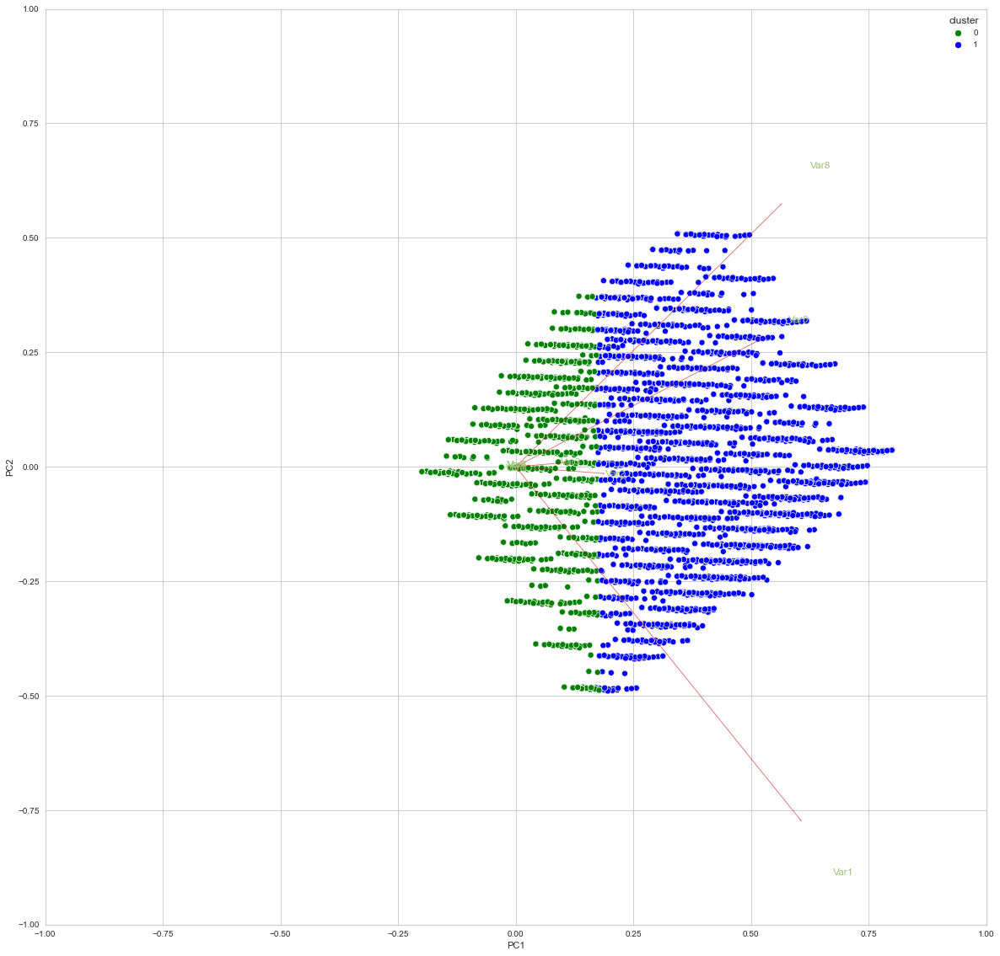

In [225]:
#Call the function. Use only the 2 PCs.
fig = plt.figure(figsize = (20,20))
myplot(printcipalComponents[:,0:2],np.transpose(pca1.components_[0:2, :]))
plt.show()

In [226]:
cluster0 = only_log_sc[only_log_sc['cluster']==0]
cluster1 = only_log_sc[only_log_sc['cluster']==1]

In [227]:
cluster0.describe()

,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,cluster
count,150938.000000,150938.000000,150938.000000,150938.000000,150938.000000,150938.000000,150938.000000,150938.000000,150938.0
mean,1.663153,0.235275,0.135042,0.004061,0.294816,0.001544,0.001683,0.888325,0.0
std,1.112508,0.550930,0.420482,0.113094,0.617472,0.039259,0.049214,0.977027,0.0
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0
75%,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0
max,6.000000,5.000000,6.000000,9.000000,5.000000,1.000000,2.000000,5.000000,0.0


In [228]:
cluster1.describe()

,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,cluster
count,30951.000000,30951.000000,30951.000000,30951.000000,30951.000000,30951.000000,30951.000000,30951.000000,30951.0
mean,4.748086,1.160253,0.635068,0.009305,3.082194,0.015541,0.021001,3.804013,1.0
std,1.536616,1.416692,1.121692,0.199135,1.644916,0.123692,0.179242,1.347038,0.0
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,4.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,3.000000,1.0
50%,6.000000,1.000000,0.000000,0.000000,3.000000,0.000000,0.000000,4.000000,1.0
75%,6.000000,2.000000,1.000000,0.000000,5.000000,0.000000,0.000000,5.000000,1.0
max,6.000000,5.000000,6.000000,9.000000,5.000000,1.000000,2.000000,5.000000,1.0


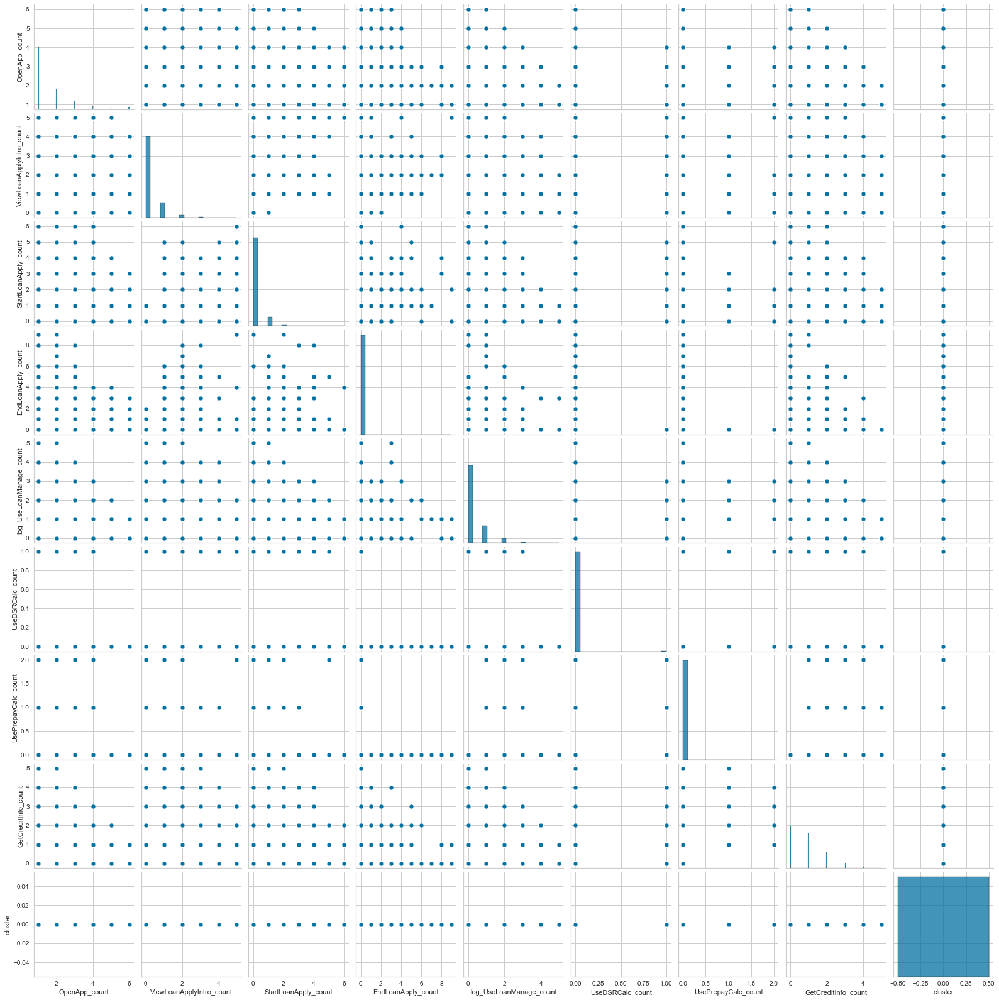

In [229]:
sns.pairplot(cluster0)

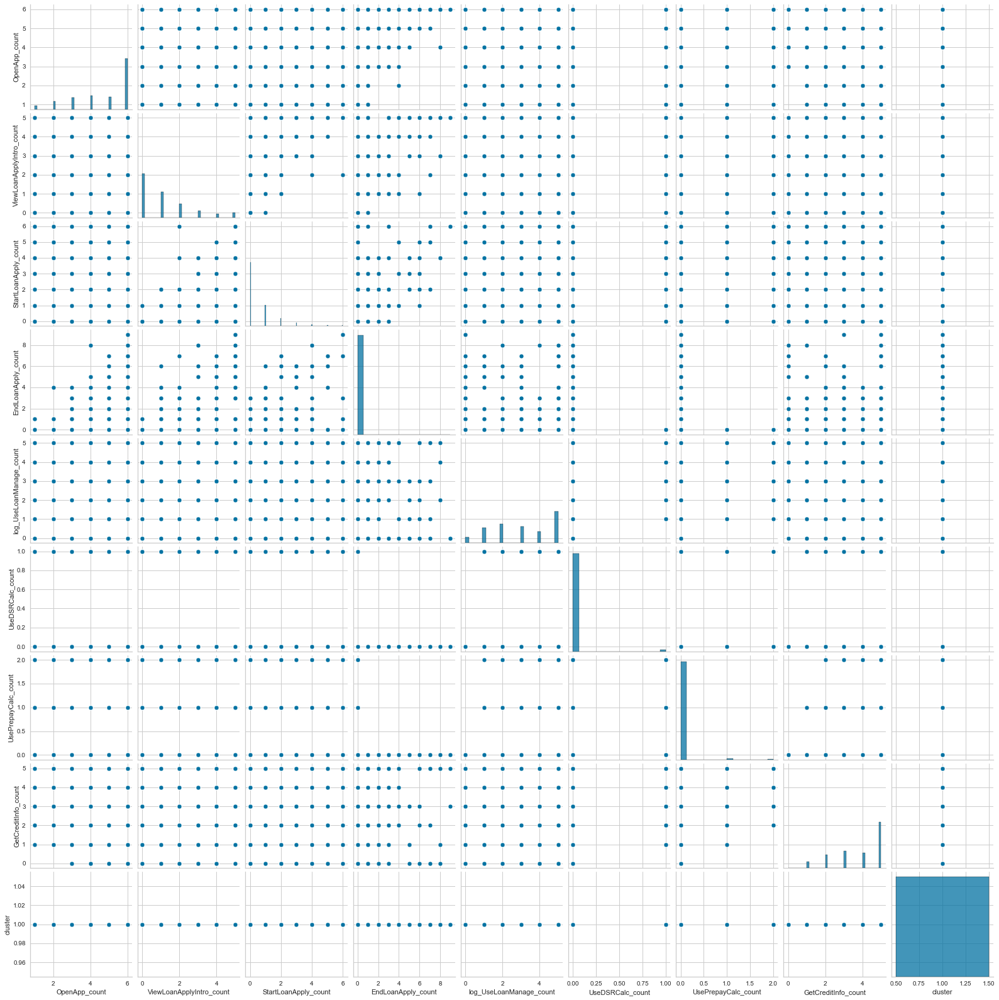

In [230]:
sns.pairplot(cluster1)

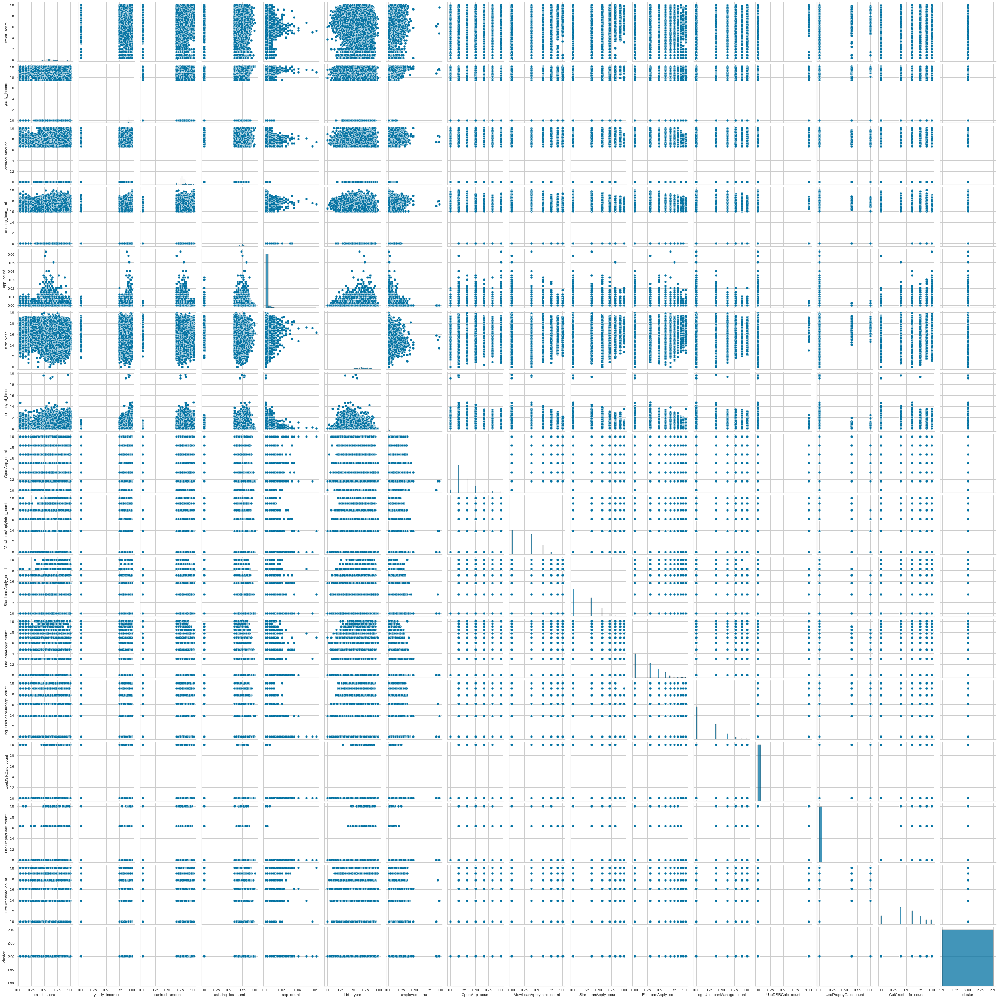

In [231]:
sns.pairplot(cluster2)

In [233]:
only_log_sc

,OpenApp_count,ViewLoanApplyIntro_count,StartLoanApply_count,EndLoanApply_count,log_UseLoanManage_count,UseDSRCalc_count,UsePrepayCalc_count,GetCreditInfo_count,cluster
29,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0
36,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
41,6.0,3.0,0.0,0.0,4.0,0.0,0.0,5.0,1
46,3.0,4.0,3.0,0.0,5.0,0.0,0.0,5.0,1
51,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...
479764,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
479765,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
479767,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
479770,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


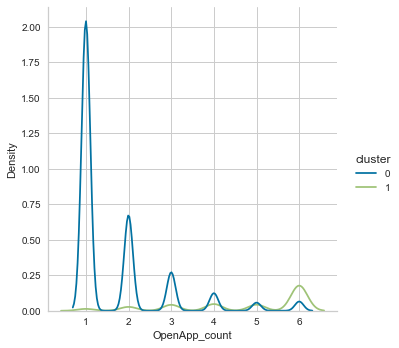

In [234]:
sns.displot(only_log_sc, x='OpenApp_count', hue="cluster", kind="kde")

<AxesSubplot:xlabel='OpenApp_count', ylabel='count'>

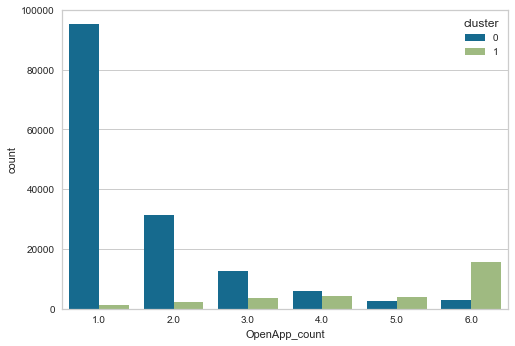

In [235]:
sns.countplot(data =only_log_sc, x='OpenApp_count', hue="cluster")

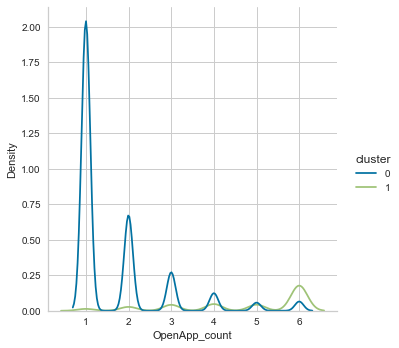

In [236]:
sns.displot(only_log_sc, x='OpenApp_count', hue="cluster", kind="kde")

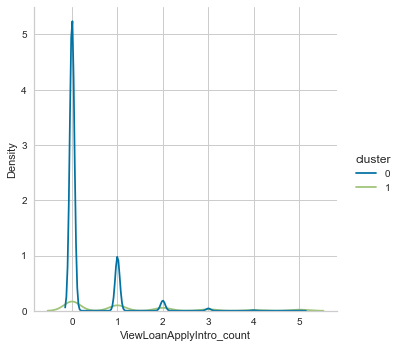

In [237]:
sns.displot(only_log_sc, x='ViewLoanApplyIntro_count', hue="cluster", kind="kde")

<AxesSubplot:xlabel='ViewLoanApplyIntro_count', ylabel='count'>

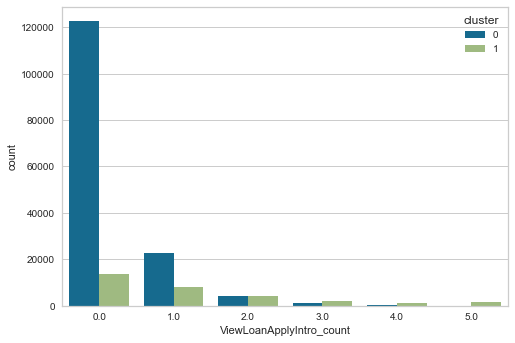

In [238]:
sns.countplot(data =only_log_sc, x='ViewLoanApplyIntro_count', hue="cluster")

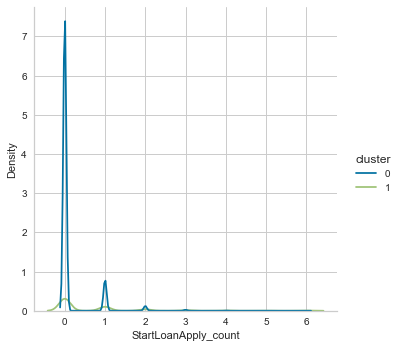

In [239]:
sns.displot(only_log_sc, x='StartLoanApply_count', hue="cluster", kind="kde")

<AxesSubplot:xlabel='StartLoanApply_count', ylabel='count'>

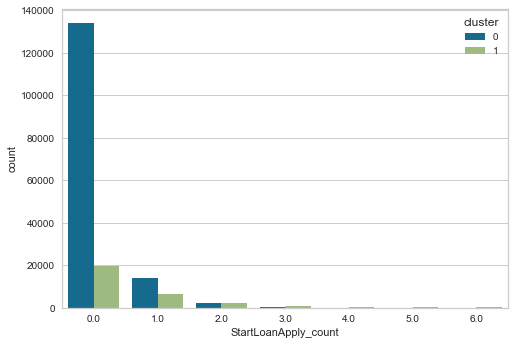

In [240]:
sns.countplot(data =only_log_sc, x='StartLoanApply_count', hue="cluster")

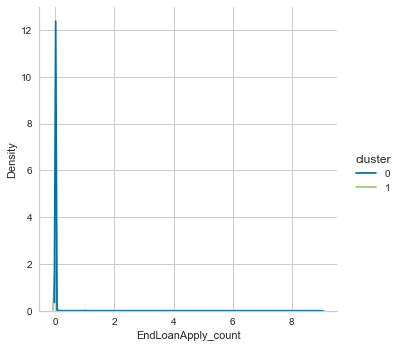

In [241]:
sns.displot(only_log_sc, x='EndLoanApply_count', hue="cluster", kind="kde")

<AxesSubplot:xlabel='EndLoanApply_count', ylabel='count'>

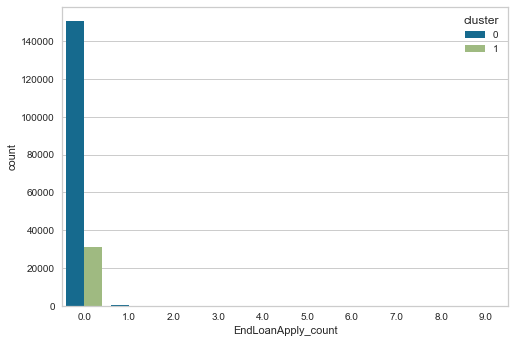

In [242]:
sns.countplot(data =only_log_sc, x='EndLoanApply_count', hue="cluster")

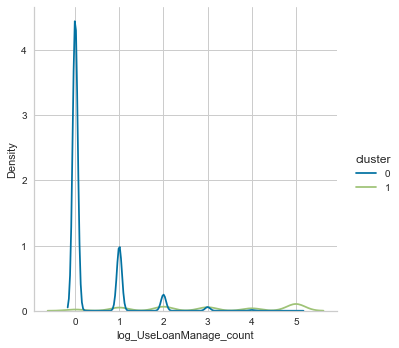

In [243]:
sns.displot(only_log_sc, x='log_UseLoanManage_count', hue="cluster", kind="kde")

<AxesSubplot:xlabel='log_UseLoanManage_count', ylabel='count'>

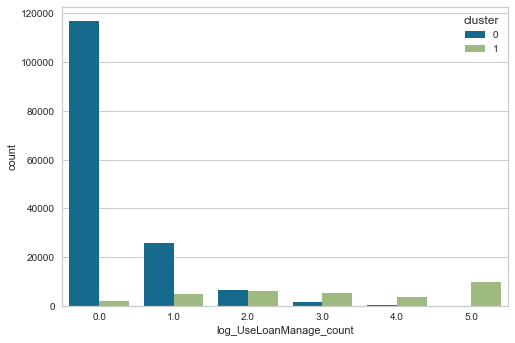

In [244]:
sns.countplot(data =only_log_sc, x='log_UseLoanManage_count', hue="cluster")

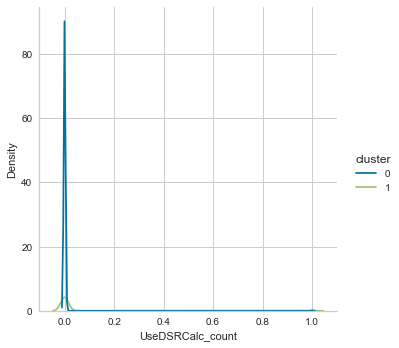

In [245]:
sns.displot(only_log_sc, x='UseDSRCalc_count', hue="cluster", kind="kde")

<AxesSubplot:xlabel='UseDSRCalc_count', ylabel='count'>

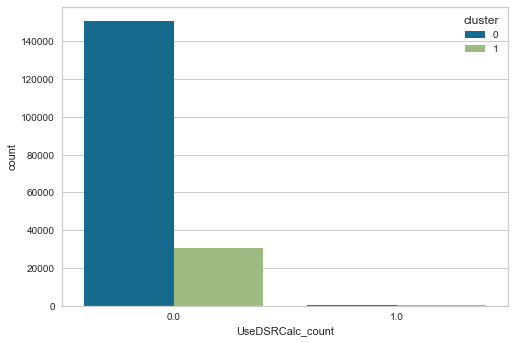

In [246]:
sns.countplot(data =only_log_sc, x='UseDSRCalc_count', hue="cluster")

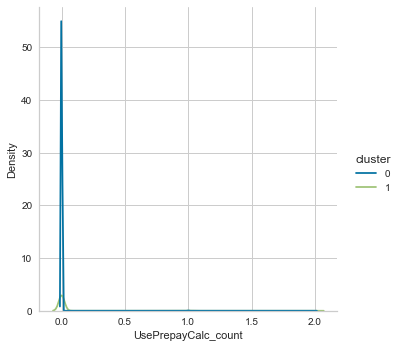

In [247]:
sns.displot(only_log_sc, x='UsePrepayCalc_count', hue="cluster", kind="kde")

<AxesSubplot:xlabel='UsePrepayCalc_count', ylabel='count'>

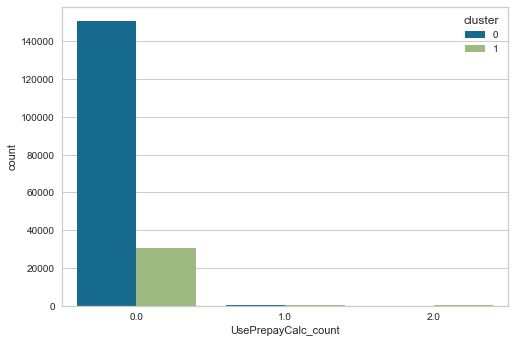

In [248]:
sns.countplot(data =only_log_sc, x='UsePrepayCalc_count', hue="cluster")

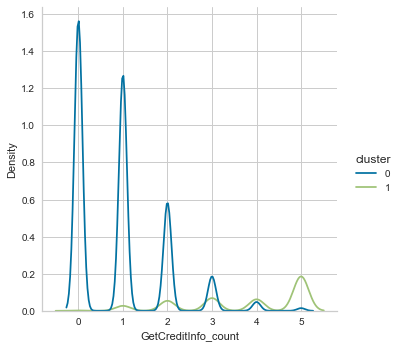

In [249]:
sns.displot(only_log_sc, x='GetCreditInfo_count', hue="cluster", kind="kde")

<AxesSubplot:xlabel='GetCreditInfo_count', ylabel='count'>

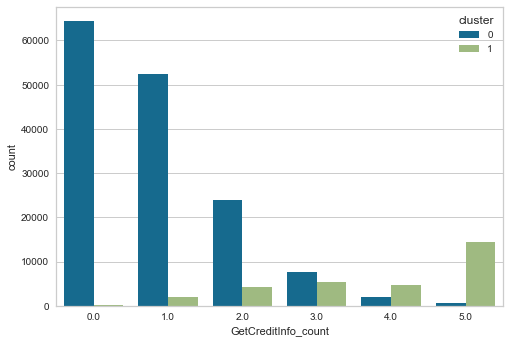

In [250]:
sns.countplot(data =only_log_sc, x='GetCreditInfo_count', hue="cluster")